In [1]:
import torch
from torchinfo import summary
import matplotlib.pyplot as plt
import numpy as np

import sys
import os
sys.path.append(os.path.abspath(os.path.join("..", "src")))
from prepare_dataset import get_dataloaders
from models import FSRCNN
from utils import train_model, save_results, load_results, evaluate_model_on_sets
%load_ext autoreload
%autoreload 2

In [2]:
# variable definitions
factor = 2
device = torch.device("cuda")
model_name = "fsrcnn"
criterion = torch.nn.MSELoss()
MODEL_CLASS = FSRCNN
train_epochs, ft_epochs = 1000, 1000
train_lr, ft_lr = 1e-4, 1e-4

### Train

In [3]:
model = MODEL_CLASS(upsample_factor=factor)
train_loader, val_loader = get_dataloaders(factor, n_workers_train=0, n_workers_val=0)
print(summary(model, input_size=(1, 1, 33, 33), device=device.type))

Layer (type:depth-idx)                   Output Shape              Param #
FSRCNN                                   [1, 1, 66, 66]            --
├─Sequential: 1-1                        [1, 56, 33, 33]           --
│    └─Conv2d: 2-1                       [1, 56, 33, 33]           1,456
│    └─PReLU: 2-2                        [1, 56, 33, 33]           56
├─Sequential: 1-2                        [1, 12, 33, 33]           --
│    └─Conv2d: 2-3                       [1, 12, 33, 33]           684
│    └─PReLU: 2-4                        [1, 12, 33, 33]           12
├─Sequential: 1-3                        [1, 12, 33, 33]           --
│    └─Conv2d: 2-5                       [1, 12, 33, 33]           1,308
│    └─PReLU: 2-6                        [1, 12, 33, 33]           12
│    └─Conv2d: 2-7                       [1, 12, 33, 33]           1,308
│    └─PReLU: 2-8                        [1, 12, 33, 33]           12
│    └─Conv2d: 2-9                       [1, 12, 33, 33]           1,308
│ 

In [4]:
train_loss, val_loss, psnr_list = train_model(model, train_loader, val_loader, factor, num_epochs=train_epochs, lr=train_lr, criterion=criterion)
save_results(model, train_loss, val_loss, psnr_list, model_name, factor)

Epoch 1/1000 - Training: 100%|██████████| 78/78 [00:26<00:00,  3.00it/s]


[Epoch 1] Train Loss: 0.035034
[Epoch 1] Validation Loss: 0.011144, PSNR: 20.15


Epoch 2/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 2] Train Loss: 0.012131
[Epoch 2] Validation Loss: 0.007123, PSNR: 22.28


Epoch 3/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 3] Train Loss: 0.007789
[Epoch 3] Validation Loss: 0.004894, PSNR: 24.07


Epoch 4/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 4] Train Loss: 0.005509
[Epoch 4] Validation Loss: 0.003681, PSNR: 25.49


Epoch 5/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 5] Train Loss: 0.004023
[Epoch 5] Validation Loss: 0.002863, PSNR: 26.78


Epoch 6/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 6] Train Loss: 0.003128
[Epoch 6] Validation Loss: 0.002453, PSNR: 27.58


Epoch 7/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 7] Train Loss: 0.002669
[Epoch 7] Validation Loss: 0.002219, PSNR: 28.11


Epoch 8/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 8] Train Loss: 0.002399
[Epoch 8] Validation Loss: 0.002061, PSNR: 28.50


Epoch 9/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 9] Train Loss: 0.002209
[Epoch 9] Validation Loss: 0.001939, PSNR: 28.83


Epoch 10/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 10] Train Loss: 0.002057
[Epoch 10] Validation Loss: 0.001841, PSNR: 29.10


Epoch 11/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 11] Train Loss: 0.001939
[Epoch 11] Validation Loss: 0.001756, PSNR: 29.36


Epoch 12/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 12] Train Loss: 0.001830
[Epoch 12] Validation Loss: 0.001682, PSNR: 29.60


Epoch 13/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 13] Train Loss: 0.001737
[Epoch 13] Validation Loss: 0.001617, PSNR: 29.82


Epoch 14/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 14] Train Loss: 0.001654
[Epoch 14] Validation Loss: 0.001559, PSNR: 30.02


Epoch 15/1000 - Training: 100%|██████████| 78/78 [00:38<00:00,  2.04it/s]


[Epoch 15] Train Loss: 0.001582
[Epoch 15] Validation Loss: 0.001506, PSNR: 30.23


Epoch 16/1000 - Training: 100%|██████████| 78/78 [00:35<00:00,  2.18it/s]


[Epoch 16] Train Loss: 0.001520
[Epoch 16] Validation Loss: 0.001462, PSNR: 30.40


Epoch 17/1000 - Training: 100%|██████████| 78/78 [00:30<00:00,  2.56it/s]


[Epoch 17] Train Loss: 0.001461
[Epoch 17] Validation Loss: 0.001419, PSNR: 30.58


Epoch 18/1000 - Training: 100%|██████████| 78/78 [00:34<00:00,  2.25it/s]


[Epoch 18] Train Loss: 0.001417
[Epoch 18] Validation Loss: 0.001425, PSNR: 30.47
No improvement for 1 epochs.


Epoch 19/1000 - Training: 100%|██████████| 78/78 [00:34<00:00,  2.26it/s]


[Epoch 19] Train Loss: 0.001375
[Epoch 19] Validation Loss: 0.001363, PSNR: 30.82


Epoch 20/1000 - Training: 100%|██████████| 78/78 [00:33<00:00,  2.30it/s]


[Epoch 20] Train Loss: 0.001340
[Epoch 20] Validation Loss: 0.001349, PSNR: 30.86


Epoch 21/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 21] Train Loss: 0.001331
[Epoch 21] Validation Loss: 0.001322, PSNR: 31.01


Epoch 22/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 22] Train Loss: 0.001286
[Epoch 22] Validation Loss: 0.001302, PSNR: 31.11


Epoch 23/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 23] Train Loss: 0.001266
[Epoch 23] Validation Loss: 0.001312, PSNR: 31.00
No improvement for 1 epochs.


Epoch 24/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 24] Train Loss: 0.001251
[Epoch 24] Validation Loss: 0.001273, PSNR: 31.25


Epoch 25/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 25] Train Loss: 0.001240
[Epoch 25] Validation Loss: 0.001261, PSNR: 31.31


Epoch 26/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 26] Train Loss: 0.001210
[Epoch 26] Validation Loss: 0.001250, PSNR: 31.36


Epoch 27/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 27] Train Loss: 0.001197
[Epoch 27] Validation Loss: 0.001238, PSNR: 31.44


Epoch 28/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 28] Train Loss: 0.001193
[Epoch 28] Validation Loss: 0.001229, PSNR: 31.49


Epoch 29/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 29] Train Loss: 0.001189
[Epoch 29] Validation Loss: 0.001221, PSNR: 31.53


Epoch 30/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 30] Train Loss: 0.001154
[Epoch 30] Validation Loss: 0.001216, PSNR: 31.55


Epoch 31/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 31] Train Loss: 0.001154
[Epoch 31] Validation Loss: 0.001206, PSNR: 31.62


Epoch 32/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 32] Train Loss: 0.001149
[Epoch 32] Validation Loss: 0.001209, PSNR: 31.57
No improvement for 1 epochs.


Epoch 33/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 33] Train Loss: 0.001130
[Epoch 33] Validation Loss: 0.001261, PSNR: 31.15
No improvement for 2 epochs.


Epoch 34/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 34] Train Loss: 0.001140
[Epoch 34] Validation Loss: 0.001189, PSNR: 31.72


Epoch 35/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.35it/s]


[Epoch 35] Train Loss: 0.001110
[Epoch 35] Validation Loss: 0.001183, PSNR: 31.75


Epoch 36/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 36] Train Loss: 0.001123
[Epoch 36] Validation Loss: 0.001178, PSNR: 31.79


Epoch 37/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 37] Train Loss: 0.001102
[Epoch 37] Validation Loss: 0.001263, PSNR: 31.10
No improvement for 1 epochs.


Epoch 38/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 38] Train Loss: 0.001103
[Epoch 38] Validation Loss: 0.001170, PSNR: 31.84


Epoch 39/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 39] Train Loss: 0.001095
[Epoch 39] Validation Loss: 0.001172, PSNR: 31.80
No improvement for 1 epochs.


Epoch 40/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 40] Train Loss: 0.001086
[Epoch 40] Validation Loss: 0.001172, PSNR: 31.78
No improvement for 2 epochs.


Epoch 41/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 41] Train Loss: 0.001102
[Epoch 41] Validation Loss: 0.001158, PSNR: 31.91


Epoch 42/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 42] Train Loss: 0.001067
[Epoch 42] Validation Loss: 0.001160, PSNR: 31.88
No improvement for 1 epochs.


Epoch 43/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 43] Train Loss: 0.001105
[Epoch 43] Validation Loss: 0.001161, PSNR: 31.86
No improvement for 2 epochs.


Epoch 44/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 44] Train Loss: 0.001059
[Epoch 44] Validation Loss: 0.001147, PSNR: 31.98


Epoch 45/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 45] Train Loss: 0.001052
[Epoch 45] Validation Loss: 0.001147, PSNR: 31.97


Epoch 46/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 46] Train Loss: 0.001053
[Epoch 46] Validation Loss: 0.001164, PSNR: 31.81
No improvement for 1 epochs.


Epoch 47/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 47] Train Loss: 0.001057
[Epoch 47] Validation Loss: 0.001144, PSNR: 31.99


Epoch 48/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 48] Train Loss: 0.001078
[Epoch 48] Validation Loss: 0.001136, PSNR: 32.05


Epoch 49/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 49] Train Loss: 0.001035
[Epoch 49] Validation Loss: 0.001133, PSNR: 32.08


Epoch 50/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 50] Train Loss: 0.001039
[Epoch 50] Validation Loss: 0.001131, PSNR: 32.09


Epoch 51/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 51] Train Loss: 0.001075
[Epoch 51] Validation Loss: 0.001206, PSNR: 31.43
No improvement for 1 epochs.


Epoch 52/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 52] Train Loss: 0.001041
[Epoch 52] Validation Loss: 0.001126, PSNR: 32.12


Epoch 53/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 53] Train Loss: 0.001021
[Epoch 53] Validation Loss: 0.001124, PSNR: 32.14


Epoch 54/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 54] Train Loss: 0.001016
[Epoch 54] Validation Loss: 0.001123, PSNR: 32.14


Epoch 55/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 55] Train Loss: 0.001023
[Epoch 55] Validation Loss: 0.001121, PSNR: 32.15


Epoch 56/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.35it/s]


[Epoch 56] Train Loss: 0.001068
[Epoch 56] Validation Loss: 0.001118, PSNR: 32.17


Epoch 57/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 57] Train Loss: 0.001008
[Epoch 57] Validation Loss: 0.001115, PSNR: 32.20


Epoch 58/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 58] Train Loss: 0.001005
[Epoch 58] Validation Loss: 0.001114, PSNR: 32.20


Epoch 59/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 59] Train Loss: 0.001025
[Epoch 59] Validation Loss: 0.001112, PSNR: 32.22


Epoch 60/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 60] Train Loss: 0.001021
[Epoch 60] Validation Loss: 0.001110, PSNR: 32.23


Epoch 61/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 61] Train Loss: 0.000997
[Epoch 61] Validation Loss: 0.001108, PSNR: 32.24


Epoch 62/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 62] Train Loss: 0.001007
[Epoch 62] Validation Loss: 0.001109, PSNR: 32.23
No improvement for 1 epochs.


Epoch 63/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 63] Train Loss: 0.000999
[Epoch 63] Validation Loss: 0.001105, PSNR: 32.26


Epoch 64/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 64] Train Loss: 0.001008
[Epoch 64] Validation Loss: 0.001103, PSNR: 32.27


Epoch 65/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 65] Train Loss: 0.001034
[Epoch 65] Validation Loss: 0.001135, PSNR: 31.95
No improvement for 1 epochs.


Epoch 66/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 66] Train Loss: 0.000989
[Epoch 66] Validation Loss: 0.001100, PSNR: 32.29


Epoch 67/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 67] Train Loss: 0.000982
[Epoch 67] Validation Loss: 0.001098, PSNR: 32.31


Epoch 68/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 68] Train Loss: 0.000987
[Epoch 68] Validation Loss: 0.001098, PSNR: 32.30


Epoch 69/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 69] Train Loss: 0.001017
[Epoch 69] Validation Loss: 0.001105, PSNR: 32.24
No improvement for 1 epochs.


Epoch 70/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 70] Train Loss: 0.000976
[Epoch 70] Validation Loss: 0.001093, PSNR: 32.34


Epoch 71/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 71] Train Loss: 0.000975
[Epoch 71] Validation Loss: 0.001092, PSNR: 32.35


Epoch 72/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 72] Train Loss: 0.001023
[Epoch 72] Validation Loss: 0.001092, PSNR: 32.35


Epoch 73/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 73] Train Loss: 0.000970
[Epoch 73] Validation Loss: 0.001090, PSNR: 32.37


Epoch 74/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 74] Train Loss: 0.000970
[Epoch 74] Validation Loss: 0.001092, PSNR: 32.34
No improvement for 1 epochs.


Epoch 75/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 75] Train Loss: 0.000993
[Epoch 75] Validation Loss: 0.001087, PSNR: 32.38


Epoch 76/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 76] Train Loss: 0.000964
[Epoch 76] Validation Loss: 0.001086, PSNR: 32.39


Epoch 77/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 77] Train Loss: 0.000989
[Epoch 77] Validation Loss: 0.001098, PSNR: 32.26
No improvement for 1 epochs.


Epoch 78/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 78] Train Loss: 0.000964
[Epoch 78] Validation Loss: 0.001085, PSNR: 32.39


Epoch 79/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 79] Train Loss: 0.000985
[Epoch 79] Validation Loss: 0.001130, PSNR: 31.95
No improvement for 1 epochs.


Epoch 80/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 80] Train Loss: 0.000976
[Epoch 80] Validation Loss: 0.001082, PSNR: 32.42


Epoch 81/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 81] Train Loss: 0.000957
[Epoch 81] Validation Loss: 0.001082, PSNR: 32.42


Epoch 82/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 82] Train Loss: 0.000975
[Epoch 82] Validation Loss: 0.001081, PSNR: 32.42


Epoch 83/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 83] Train Loss: 0.000960
[Epoch 83] Validation Loss: 0.001080, PSNR: 32.43


Epoch 84/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 84] Train Loss: 0.000973
[Epoch 84] Validation Loss: 0.001079, PSNR: 32.43


Epoch 85/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 85] Train Loss: 0.000957
[Epoch 85] Validation Loss: 0.001086, PSNR: 32.35
No improvement for 1 epochs.


Epoch 86/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 86] Train Loss: 0.000969
[Epoch 86] Validation Loss: 0.001077, PSNR: 32.45


Epoch 87/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 87] Train Loss: 0.000951
[Epoch 87] Validation Loss: 0.001079, PSNR: 32.43
No improvement for 1 epochs.


Epoch 88/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 88] Train Loss: 0.000977
[Epoch 88] Validation Loss: 0.001074, PSNR: 32.47


Epoch 89/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 89] Train Loss: 0.000946
[Epoch 89] Validation Loss: 0.001076, PSNR: 32.45
No improvement for 1 epochs.


Epoch 90/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 90] Train Loss: 0.000997
[Epoch 90] Validation Loss: 0.001084, PSNR: 32.36
No improvement for 2 epochs.


Epoch 91/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 91] Train Loss: 0.000943
[Epoch 91] Validation Loss: 0.001072, PSNR: 32.49


Epoch 92/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 92] Train Loss: 0.000941
[Epoch 92] Validation Loss: 0.001071, PSNR: 32.49


Epoch 93/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 93] Train Loss: 0.000955
[Epoch 93] Validation Loss: 0.001088, PSNR: 32.31
No improvement for 1 epochs.


Epoch 94/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 94] Train Loss: 0.000946
[Epoch 94] Validation Loss: 0.001070, PSNR: 32.49


Epoch 95/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 95] Train Loss: 0.000953
[Epoch 95] Validation Loss: 0.001070, PSNR: 32.50


Epoch 96/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 96] Train Loss: 0.000967
[Epoch 96] Validation Loss: 0.001094, PSNR: 32.23
No improvement for 1 epochs.


Epoch 97/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 97] Train Loss: 0.000938
[Epoch 97] Validation Loss: 0.001068, PSNR: 32.51


Epoch 98/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 98] Train Loss: 0.000936
[Epoch 98] Validation Loss: 0.001068, PSNR: 32.51


Epoch 99/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 99] Train Loss: 0.000953
[Epoch 99] Validation Loss: 0.001066, PSNR: 32.52


Epoch 100/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 100] Train Loss: 0.000941
[Epoch 100] Validation Loss: 0.001066, PSNR: 32.53


Epoch 101/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 101] Train Loss: 0.000992
[Epoch 101] Validation Loss: 0.001159, PSNR: 31.66
No improvement for 1 epochs.


Epoch 102/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 102] Train Loss: 0.000938
[Epoch 102] Validation Loss: 0.001065, PSNR: 32.54


Epoch 103/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 103] Train Loss: 0.000930
[Epoch 103] Validation Loss: 0.001064, PSNR: 32.54


Epoch 104/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 104] Train Loss: 0.000928
[Epoch 104] Validation Loss: 0.001064, PSNR: 32.54


Epoch 105/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 105] Train Loss: 0.000930
[Epoch 105] Validation Loss: 0.001063, PSNR: 32.54


Epoch 106/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 106] Train Loss: 0.000982
[Epoch 106] Validation Loss: 0.001063, PSNR: 32.55


Epoch 107/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 107] Train Loss: 0.000926
[Epoch 107] Validation Loss: 0.001061, PSNR: 32.56


Epoch 108/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 108] Train Loss: 0.000929
[Epoch 108] Validation Loss: 0.001155, PSNR: 31.66
No improvement for 1 epochs.


Epoch 109/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 109] Train Loss: 0.000935
[Epoch 109] Validation Loss: 0.001063, PSNR: 32.53
No improvement for 2 epochs.


Epoch 110/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 110] Train Loss: 0.000924
[Epoch 110] Validation Loss: 0.001066, PSNR: 32.50
No improvement for 3 epochs.


Epoch 111/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 111] Train Loss: 0.000945
[Epoch 111] Validation Loss: 0.001062, PSNR: 32.54
No improvement for 4 epochs.


Epoch 112/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 112] Train Loss: 0.000949
[Epoch 112] Validation Loss: 0.001078, PSNR: 32.37
No improvement for 5 epochs.


Epoch 113/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 113] Train Loss: 0.000926
[Epoch 113] Validation Loss: 0.001058, PSNR: 32.58


Epoch 114/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 114] Train Loss: 0.000920
[Epoch 114] Validation Loss: 0.001058, PSNR: 32.58


Epoch 115/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 115] Train Loss: 0.000926
[Epoch 115] Validation Loss: 0.001060, PSNR: 32.56
No improvement for 1 epochs.


Epoch 116/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 116] Train Loss: 0.000930
[Epoch 116] Validation Loss: 0.001057, PSNR: 32.59


Epoch 117/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 117] Train Loss: 0.000935
[Epoch 117] Validation Loss: 0.001061, PSNR: 32.54
No improvement for 1 epochs.


Epoch 118/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 118] Train Loss: 0.000926
[Epoch 118] Validation Loss: 0.001063, PSNR: 32.51
No improvement for 2 epochs.


Epoch 119/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 119] Train Loss: 0.000930
[Epoch 119] Validation Loss: 0.001059, PSNR: 32.56
No improvement for 3 epochs.


Epoch 120/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 120] Train Loss: 0.000932
[Epoch 120] Validation Loss: 0.001071, PSNR: 32.42
No improvement for 4 epochs.


Epoch 121/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 121] Train Loss: 0.000919
[Epoch 121] Validation Loss: 0.001148, PSNR: 31.71
No improvement for 5 epochs.


Epoch 122/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 122] Train Loss: 0.000929
[Epoch 122] Validation Loss: 0.001056, PSNR: 32.59


Epoch 123/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 123] Train Loss: 0.000920
[Epoch 123] Validation Loss: 0.001054, PSNR: 32.61


Epoch 124/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 124] Train Loss: 0.000931
[Epoch 124] Validation Loss: 0.001053, PSNR: 32.61


Epoch 125/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 125] Train Loss: 0.000915
[Epoch 125] Validation Loss: 0.001073, PSNR: 32.39
No improvement for 1 epochs.


Epoch 126/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 126] Train Loss: 0.000917
[Epoch 126] Validation Loss: 0.001052, PSNR: 32.63


Epoch 127/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.35it/s]


[Epoch 127] Train Loss: 0.000954
[Epoch 127] Validation Loss: 0.001052, PSNR: 32.62
No improvement for 1 epochs.


Epoch 128/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 128] Train Loss: 0.000909
[Epoch 128] Validation Loss: 0.001051, PSNR: 32.63


Epoch 129/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 129] Train Loss: 0.000909
[Epoch 129] Validation Loss: 0.001060, PSNR: 32.52
No improvement for 1 epochs.


Epoch 130/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 130] Train Loss: 0.000918
[Epoch 130] Validation Loss: 0.001058, PSNR: 32.55
No improvement for 2 epochs.


Epoch 131/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 131] Train Loss: 0.000948
[Epoch 131] Validation Loss: 0.001049, PSNR: 32.64


Epoch 132/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 132] Train Loss: 0.000907
[Epoch 132] Validation Loss: 0.001049, PSNR: 32.64


Epoch 133/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 133] Train Loss: 0.000906
[Epoch 133] Validation Loss: 0.001051, PSNR: 32.62
No improvement for 1 epochs.


Epoch 134/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 134] Train Loss: 0.000919
[Epoch 134] Validation Loss: 0.001096, PSNR: 32.14
No improvement for 2 epochs.


Epoch 135/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 135] Train Loss: 0.000911
[Epoch 135] Validation Loss: 0.001049, PSNR: 32.63
No improvement for 3 epochs.


Epoch 136/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 136] Train Loss: 0.000912
[Epoch 136] Validation Loss: 0.001047, PSNR: 32.65


Epoch 137/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 137] Train Loss: 0.000924
[Epoch 137] Validation Loss: 0.001048, PSNR: 32.65
No improvement for 1 epochs.


Epoch 138/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 138] Train Loss: 0.000903
[Epoch 138] Validation Loss: 0.001052, PSNR: 32.59
No improvement for 2 epochs.


Epoch 139/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 139] Train Loss: 0.000929
[Epoch 139] Validation Loss: 0.001046, PSNR: 32.66


Epoch 140/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 140] Train Loss: 0.000902
[Epoch 140] Validation Loss: 0.001046, PSNR: 32.66
No improvement for 1 epochs.


Epoch 141/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 141] Train Loss: 0.000914
[Epoch 141] Validation Loss: 0.001045, PSNR: 32.67


Epoch 142/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 142] Train Loss: 0.000901
[Epoch 142] Validation Loss: 0.001060, PSNR: 32.50
No improvement for 1 epochs.


Epoch 143/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 143] Train Loss: 0.000940
[Epoch 143] Validation Loss: 0.001045, PSNR: 32.67


Epoch 144/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 144] Train Loss: 0.000899
[Epoch 144] Validation Loss: 0.001044, PSNR: 32.68


Epoch 145/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 145] Train Loss: 0.000898
[Epoch 145] Validation Loss: 0.001044, PSNR: 32.68


Epoch 146/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 146] Train Loss: 0.000920
[Epoch 146] Validation Loss: 0.001061, PSNR: 32.48
No improvement for 1 epochs.


Epoch 147/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 147] Train Loss: 0.000902
[Epoch 147] Validation Loss: 0.001043, PSNR: 32.68


Epoch 148/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 148] Train Loss: 0.000898
[Epoch 148] Validation Loss: 0.001053, PSNR: 32.56
No improvement for 1 epochs.


Epoch 149/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 149] Train Loss: 0.000905
[Epoch 149] Validation Loss: 0.001042, PSNR: 32.69


Epoch 150/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 150] Train Loss: 0.000907
[Epoch 150] Validation Loss: 0.001080, PSNR: 32.27
No improvement for 1 epochs.


Epoch 151/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.35it/s]


[Epoch 151] Train Loss: 0.000904
[Epoch 151] Validation Loss: 0.001042, PSNR: 32.69


Epoch 152/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 152] Train Loss: 0.000909
[Epoch 152] Validation Loss: 0.001045, PSNR: 32.65
No improvement for 1 epochs.


Epoch 153/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 153] Train Loss: 0.000894
[Epoch 153] Validation Loss: 0.001041, PSNR: 32.70


Epoch 154/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 154] Train Loss: 0.000907
[Epoch 154] Validation Loss: 0.001043, PSNR: 32.67
No improvement for 1 epochs.


Epoch 155/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 155] Train Loss: 0.000904
[Epoch 155] Validation Loss: 0.001040, PSNR: 32.71


Epoch 156/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 156] Train Loss: 0.000906
[Epoch 156] Validation Loss: 0.001040, PSNR: 32.70
No improvement for 1 epochs.


Epoch 157/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 157] Train Loss: 0.000891
[Epoch 157] Validation Loss: 0.001039, PSNR: 32.71


Epoch 158/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 158] Train Loss: 0.000908
[Epoch 158] Validation Loss: 0.001040, PSNR: 32.70
No improvement for 1 epochs.


Epoch 159/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 159] Train Loss: 0.000893
[Epoch 159] Validation Loss: 0.001043, PSNR: 32.66
No improvement for 2 epochs.


Epoch 160/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 160] Train Loss: 0.000897
[Epoch 160] Validation Loss: 0.001111, PSNR: 31.96
No improvement for 3 epochs.


Epoch 161/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 161] Train Loss: 0.000896
[Epoch 161] Validation Loss: 0.001039, PSNR: 32.70


Epoch 162/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 162] Train Loss: 0.000895
[Epoch 162] Validation Loss: 0.001047, PSNR: 32.60
No improvement for 1 epochs.


Epoch 163/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 163] Train Loss: 0.000909
[Epoch 163] Validation Loss: 0.001036, PSNR: 32.73


Epoch 164/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 164] Train Loss: 0.000888
[Epoch 164] Validation Loss: 0.001035, PSNR: 32.73


Epoch 165/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.35it/s]


[Epoch 165] Train Loss: 0.000890
[Epoch 165] Validation Loss: 0.001043, PSNR: 32.64
No improvement for 1 epochs.


Epoch 166/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.35it/s]


[Epoch 166] Train Loss: 0.000902
[Epoch 166] Validation Loss: 0.001035, PSNR: 32.73


Epoch 167/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 167] Train Loss: 0.000896
[Epoch 167] Validation Loss: 0.001065, PSNR: 32.40
No improvement for 1 epochs.


Epoch 168/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 168] Train Loss: 0.000886
[Epoch 168] Validation Loss: 0.001042, PSNR: 32.64
No improvement for 2 epochs.


Epoch 169/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 169] Train Loss: 0.000893
[Epoch 169] Validation Loss: 0.001033, PSNR: 32.75


Epoch 170/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 170] Train Loss: 0.000902
[Epoch 170] Validation Loss: 0.001102, PSNR: 32.03
No improvement for 1 epochs.


Epoch 171/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 171] Train Loss: 0.000890
[Epoch 171] Validation Loss: 0.001034, PSNR: 32.73
No improvement for 2 epochs.


Epoch 172/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 172] Train Loss: 0.000882
[Epoch 172] Validation Loss: 0.001033, PSNR: 32.74
No improvement for 3 epochs.


Epoch 173/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 173] Train Loss: 0.000888
[Epoch 173] Validation Loss: 0.001051, PSNR: 32.54
No improvement for 4 epochs.


Epoch 174/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.35it/s]


[Epoch 174] Train Loss: 0.000889
[Epoch 174] Validation Loss: 0.001032, PSNR: 32.76


Epoch 175/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 175] Train Loss: 0.000888
[Epoch 175] Validation Loss: 0.001030, PSNR: 32.77


Epoch 176/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 176] Train Loss: 0.000900
[Epoch 176] Validation Loss: 0.001033, PSNR: 32.74
No improvement for 1 epochs.


Epoch 177/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 177] Train Loss: 0.000879
[Epoch 177] Validation Loss: 0.001030, PSNR: 32.77


Epoch 178/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 178] Train Loss: 0.000882
[Epoch 178] Validation Loss: 0.001032, PSNR: 32.74
No improvement for 1 epochs.


Epoch 179/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 179] Train Loss: 0.000888
[Epoch 179] Validation Loss: 0.001042, PSNR: 32.63
No improvement for 2 epochs.


Epoch 180/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 180] Train Loss: 0.000879
[Epoch 180] Validation Loss: 0.001028, PSNR: 32.78


Epoch 181/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 181] Train Loss: 0.000897
[Epoch 181] Validation Loss: 0.001029, PSNR: 32.78
No improvement for 1 epochs.


Epoch 182/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 182] Train Loss: 0.000875
[Epoch 182] Validation Loss: 0.001030, PSNR: 32.76
No improvement for 2 epochs.


Epoch 183/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 183] Train Loss: 0.000885
[Epoch 183] Validation Loss: 0.001027, PSNR: 32.79


Epoch 184/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 184] Train Loss: 0.000878
[Epoch 184] Validation Loss: 0.001028, PSNR: 32.78
No improvement for 1 epochs.


Epoch 185/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 185] Train Loss: 0.000881
[Epoch 185] Validation Loss: 0.001031, PSNR: 32.74
No improvement for 2 epochs.


Epoch 186/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 186] Train Loss: 0.000875
[Epoch 186] Validation Loss: 0.001041, PSNR: 32.62
No improvement for 3 epochs.


Epoch 187/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 187] Train Loss: 0.000884
[Epoch 187] Validation Loss: 0.001034, PSNR: 32.70
No improvement for 4 epochs.


Epoch 188/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 188] Train Loss: 0.000875
[Epoch 188] Validation Loss: 0.001026, PSNR: 32.79


Epoch 189/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 189] Train Loss: 0.000881
[Epoch 189] Validation Loss: 0.001025, PSNR: 32.80


Epoch 190/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 190] Train Loss: 0.000872
[Epoch 190] Validation Loss: 0.001034, PSNR: 32.70
No improvement for 1 epochs.


Epoch 191/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 191] Train Loss: 0.000876
[Epoch 191] Validation Loss: 0.001024, PSNR: 32.81


Epoch 192/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 192] Train Loss: 0.000888
[Epoch 192] Validation Loss: 0.001023, PSNR: 32.82


Epoch 193/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 193] Train Loss: 0.000868
[Epoch 193] Validation Loss: 0.001038, PSNR: 32.64
No improvement for 1 epochs.


Epoch 194/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 194] Train Loss: 0.000879
[Epoch 194] Validation Loss: 0.001026, PSNR: 32.78
No improvement for 2 epochs.


Epoch 195/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 195] Train Loss: 0.000870
[Epoch 195] Validation Loss: 0.001023, PSNR: 32.82


Epoch 196/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 196] Train Loss: 0.000879
[Epoch 196] Validation Loss: 0.001023, PSNR: 32.81
No improvement for 1 epochs.


Epoch 197/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 197] Train Loss: 0.000868
[Epoch 197] Validation Loss: 0.001022, PSNR: 32.82


Epoch 198/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 198] Train Loss: 0.000877
[Epoch 198] Validation Loss: 0.001021, PSNR: 32.84


Epoch 199/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.34it/s]


[Epoch 199] Train Loss: 0.000868
[Epoch 199] Validation Loss: 0.001028, PSNR: 32.74
No improvement for 1 epochs.


Epoch 200/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 200] Train Loss: 0.000875
[Epoch 200] Validation Loss: 0.001021, PSNR: 32.82
No improvement for 2 epochs.


Epoch 201/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.35it/s]


[Epoch 201] Train Loss: 0.000871
[Epoch 201] Validation Loss: 0.001019, PSNR: 32.84


Epoch 202/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 202] Train Loss: 0.000870
[Epoch 202] Validation Loss: 0.001022, PSNR: 32.80
No improvement for 1 epochs.


Epoch 203/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.37it/s]


[Epoch 203] Train Loss: 0.000870
[Epoch 203] Validation Loss: 0.001021, PSNR: 32.82
No improvement for 2 epochs.


Epoch 204/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 204] Train Loss: 0.000870
[Epoch 204] Validation Loss: 0.001019, PSNR: 32.85


Epoch 205/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.10it/s]


[Epoch 205] Train Loss: 0.000864
[Epoch 205] Validation Loss: 0.001018, PSNR: 32.85


Epoch 206/1000 - Training: 100%|██████████| 78/78 [00:25<00:00,  3.12it/s]


[Epoch 206] Train Loss: 0.000884
[Epoch 206] Validation Loss: 0.001017, PSNR: 32.86


Epoch 207/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 207] Train Loss: 0.000860
[Epoch 207] Validation Loss: 0.001017, PSNR: 32.85


Epoch 208/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 208] Train Loss: 0.000864
[Epoch 208] Validation Loss: 0.001017, PSNR: 32.86


Epoch 209/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 209] Train Loss: 0.000862
[Epoch 209] Validation Loss: 0.001017, PSNR: 32.85
No improvement for 1 epochs.


Epoch 210/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 210] Train Loss: 0.000880
[Epoch 210] Validation Loss: 0.001021, PSNR: 32.81
No improvement for 2 epochs.


Epoch 211/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 211] Train Loss: 0.000857
[Epoch 211] Validation Loss: 0.001016, PSNR: 32.87


Epoch 212/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 212] Train Loss: 0.000860
[Epoch 212] Validation Loss: 0.001016, PSNR: 32.86
No improvement for 1 epochs.


Epoch 213/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 213] Train Loss: 0.000868
[Epoch 213] Validation Loss: 0.001038, PSNR: 32.59
No improvement for 2 epochs.


Epoch 214/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 214] Train Loss: 0.000859
[Epoch 214] Validation Loss: 0.001015, PSNR: 32.87


Epoch 215/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 215] Train Loss: 0.000863
[Epoch 215] Validation Loss: 0.001016, PSNR: 32.85
No improvement for 1 epochs.


Epoch 216/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 216] Train Loss: 0.000860
[Epoch 216] Validation Loss: 0.001022, PSNR: 32.78
No improvement for 2 epochs.


Epoch 217/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 217] Train Loss: 0.000861
[Epoch 217] Validation Loss: 0.001017, PSNR: 32.84
No improvement for 3 epochs.


Epoch 218/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 218] Train Loss: 0.000867
[Epoch 218] Validation Loss: 0.001016, PSNR: 32.85
No improvement for 4 epochs.


Epoch 219/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 219] Train Loss: 0.000854
[Epoch 219] Validation Loss: 0.001013, PSNR: 32.89


Epoch 220/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 220] Train Loss: 0.000859
[Epoch 220] Validation Loss: 0.001018, PSNR: 32.82
No improvement for 1 epochs.


Epoch 221/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 221] Train Loss: 0.000860
[Epoch 221] Validation Loss: 0.001064, PSNR: 32.32
No improvement for 2 epochs.


Epoch 222/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 222] Train Loss: 0.000855
[Epoch 222] Validation Loss: 0.001020, PSNR: 32.79
No improvement for 3 epochs.


Epoch 223/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 223] Train Loss: 0.000856
[Epoch 223] Validation Loss: 0.001015, PSNR: 32.85
No improvement for 4 epochs.


Epoch 224/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 224] Train Loss: 0.000872
[Epoch 224] Validation Loss: 0.001012, PSNR: 32.89


Epoch 225/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 225] Train Loss: 0.000849
[Epoch 225] Validation Loss: 0.001010, PSNR: 32.91


Epoch 226/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 226] Train Loss: 0.000850
[Epoch 226] Validation Loss: 0.001011, PSNR: 32.90
No improvement for 1 epochs.


Epoch 227/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 227] Train Loss: 0.000870
[Epoch 227] Validation Loss: 0.001018, PSNR: 32.80
No improvement for 2 epochs.


Epoch 228/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 228] Train Loss: 0.000857
[Epoch 228] Validation Loss: 0.001009, PSNR: 32.91


Epoch 229/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 229] Train Loss: 0.000846
[Epoch 229] Validation Loss: 0.001010, PSNR: 32.91
No improvement for 1 epochs.


Epoch 230/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 230] Train Loss: 0.000848
[Epoch 230] Validation Loss: 0.001009, PSNR: 32.92


Epoch 231/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 231] Train Loss: 0.000863
[Epoch 231] Validation Loss: 0.001009, PSNR: 32.92
No improvement for 1 epochs.


Epoch 232/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.15it/s]


[Epoch 232] Train Loss: 0.000846
[Epoch 232] Validation Loss: 0.001008, PSNR: 32.92


Epoch 233/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 233] Train Loss: 0.000852
[Epoch 233] Validation Loss: 0.001008, PSNR: 32.92


Epoch 234/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 234] Train Loss: 0.000849
[Epoch 234] Validation Loss: 0.001015, PSNR: 32.84
No improvement for 1 epochs.


Epoch 235/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 235] Train Loss: 0.000852
[Epoch 235] Validation Loss: 0.001033, PSNR: 32.63
No improvement for 2 epochs.


Epoch 236/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 236] Train Loss: 0.000861
[Epoch 236] Validation Loss: 0.001033, PSNR: 32.62
No improvement for 3 epochs.


Epoch 237/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 237] Train Loss: 0.000852
[Epoch 237] Validation Loss: 0.001007, PSNR: 32.94


Epoch 238/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 238] Train Loss: 0.000842
[Epoch 238] Validation Loss: 0.001006, PSNR: 32.94


Epoch 239/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 239] Train Loss: 0.000862
[Epoch 239] Validation Loss: 0.001030, PSNR: 32.66
No improvement for 1 epochs.


Epoch 240/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 240] Train Loss: 0.000844
[Epoch 240] Validation Loss: 0.001008, PSNR: 32.91
No improvement for 2 epochs.


Epoch 241/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 241] Train Loss: 0.000841
[Epoch 241] Validation Loss: 0.001005, PSNR: 32.94


Epoch 242/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 242] Train Loss: 0.000858
[Epoch 242] Validation Loss: 0.001006, PSNR: 32.93
No improvement for 1 epochs.


Epoch 243/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 243] Train Loss: 0.000844
[Epoch 243] Validation Loss: 0.001005, PSNR: 32.95


Epoch 244/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 244] Train Loss: 0.000840
[Epoch 244] Validation Loss: 0.001005, PSNR: 32.95
No improvement for 1 epochs.


Epoch 245/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 245] Train Loss: 0.000859
[Epoch 245] Validation Loss: 0.001004, PSNR: 32.95


Epoch 246/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 246] Train Loss: 0.000839
[Epoch 246] Validation Loss: 0.001004, PSNR: 32.95
No improvement for 1 epochs.


Epoch 247/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 247] Train Loss: 0.000845
[Epoch 247] Validation Loss: 0.001027, PSNR: 32.67
No improvement for 2 epochs.


Epoch 248/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 248] Train Loss: 0.000845
[Epoch 248] Validation Loss: 0.001003, PSNR: 32.96


Epoch 249/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 249] Train Loss: 0.000849
[Epoch 249] Validation Loss: 0.001003, PSNR: 32.97


Epoch 250/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 250] Train Loss: 0.000838
[Epoch 250] Validation Loss: 0.001005, PSNR: 32.94
No improvement for 1 epochs.


Epoch 251/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 251] Train Loss: 0.000846
[Epoch 251] Validation Loss: 0.001005, PSNR: 32.94
No improvement for 2 epochs.


Epoch 252/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 252] Train Loss: 0.000837
[Epoch 252] Validation Loss: 0.001002, PSNR: 32.97


Epoch 253/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 253] Train Loss: 0.000855
[Epoch 253] Validation Loss: 0.001012, PSNR: 32.84
No improvement for 1 epochs.


Epoch 254/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 254] Train Loss: 0.000838
[Epoch 254] Validation Loss: 0.001002, PSNR: 32.97


Epoch 255/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 255] Train Loss: 0.000835
[Epoch 255] Validation Loss: 0.001001, PSNR: 32.98


Epoch 256/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 256] Train Loss: 0.000843
[Epoch 256] Validation Loss: 0.001002, PSNR: 32.96
No improvement for 1 epochs.


Epoch 257/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 257] Train Loss: 0.000833
[Epoch 257] Validation Loss: 0.001011, PSNR: 32.86
No improvement for 2 epochs.


Epoch 258/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 258] Train Loss: 0.000856
[Epoch 258] Validation Loss: 0.001001, PSNR: 32.98


Epoch 259/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 259] Train Loss: 0.000833
[Epoch 259] Validation Loss: 0.001000, PSNR: 32.99


Epoch 260/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 260] Train Loss: 0.000837
[Epoch 260] Validation Loss: 0.001001, PSNR: 32.97
No improvement for 1 epochs.


Epoch 261/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 261] Train Loss: 0.000842
[Epoch 261] Validation Loss: 0.001000, PSNR: 32.98


Epoch 262/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 262] Train Loss: 0.000837
[Epoch 262] Validation Loss: 0.001006, PSNR: 32.91
No improvement for 1 epochs.


Epoch 263/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 263] Train Loss: 0.000843
[Epoch 263] Validation Loss: 0.001006, PSNR: 32.90
No improvement for 2 epochs.


Epoch 264/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 264] Train Loss: 0.000834
[Epoch 264] Validation Loss: 0.000999, PSNR: 32.99


Epoch 265/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 265] Train Loss: 0.000844
[Epoch 265] Validation Loss: 0.001001, PSNR: 32.97
No improvement for 1 epochs.


Epoch 266/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 266] Train Loss: 0.000833
[Epoch 266] Validation Loss: 0.000998, PSNR: 33.00


Epoch 267/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 267] Train Loss: 0.000836
[Epoch 267] Validation Loss: 0.001004, PSNR: 32.93
No improvement for 1 epochs.


Epoch 268/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 268] Train Loss: 0.000841
[Epoch 268] Validation Loss: 0.001007, PSNR: 32.89
No improvement for 2 epochs.


Epoch 269/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 269] Train Loss: 0.000831
[Epoch 269] Validation Loss: 0.000998, PSNR: 33.00


Epoch 270/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 270] Train Loss: 0.000838
[Epoch 270] Validation Loss: 0.001097, PSNR: 31.97
No improvement for 1 epochs.


Epoch 271/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 271] Train Loss: 0.000835
[Epoch 271] Validation Loss: 0.000997, PSNR: 33.01


Epoch 272/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 272] Train Loss: 0.000827
[Epoch 272] Validation Loss: 0.001003, PSNR: 32.93
No improvement for 1 epochs.


Epoch 273/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 273] Train Loss: 0.000836
[Epoch 273] Validation Loss: 0.000997, PSNR: 33.01
No improvement for 2 epochs.


Epoch 274/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 274] Train Loss: 0.000839
[Epoch 274] Validation Loss: 0.000996, PSNR: 33.01


Epoch 275/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 275] Train Loss: 0.000827
[Epoch 275] Validation Loss: 0.000996, PSNR: 33.02


Epoch 276/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 276] Train Loss: 0.000833
[Epoch 276] Validation Loss: 0.000995, PSNR: 33.02


Epoch 277/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 277] Train Loss: 0.000826
[Epoch 277] Validation Loss: 0.000995, PSNR: 33.03


Epoch 278/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 278] Train Loss: 0.000838
[Epoch 278] Validation Loss: 0.000995, PSNR: 33.02
No improvement for 1 epochs.


Epoch 279/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 279] Train Loss: 0.000825
[Epoch 279] Validation Loss: 0.001007, PSNR: 32.88
No improvement for 2 epochs.


Epoch 280/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 280] Train Loss: 0.000829
[Epoch 280] Validation Loss: 0.000995, PSNR: 33.02
No improvement for 3 epochs.


Epoch 281/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 281] Train Loss: 0.000840
[Epoch 281] Validation Loss: 0.001007, PSNR: 32.87
No improvement for 4 epochs.


Epoch 282/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 282] Train Loss: 0.000824
[Epoch 282] Validation Loss: 0.000994, PSNR: 33.03


Epoch 283/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 283] Train Loss: 0.000824
[Epoch 283] Validation Loss: 0.000994, PSNR: 33.04


Epoch 284/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 284] Train Loss: 0.000828
[Epoch 284] Validation Loss: 0.000993, PSNR: 33.04


Epoch 285/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 285] Train Loss: 0.000829
[Epoch 285] Validation Loss: 0.000993, PSNR: 33.04


Epoch 286/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 286] Train Loss: 0.000825
[Epoch 286] Validation Loss: 0.000998, PSNR: 32.98
No improvement for 1 epochs.


Epoch 287/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 287] Train Loss: 0.000827
[Epoch 287] Validation Loss: 0.000992, PSNR: 33.05


Epoch 288/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 288] Train Loss: 0.000836
[Epoch 288] Validation Loss: 0.001012, PSNR: 32.80
No improvement for 1 epochs.


Epoch 289/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 289] Train Loss: 0.000822
[Epoch 289] Validation Loss: 0.000992, PSNR: 33.05


Epoch 290/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 290] Train Loss: 0.000822
[Epoch 290] Validation Loss: 0.000992, PSNR: 33.04
No improvement for 1 epochs.


Epoch 291/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 291] Train Loss: 0.000829
[Epoch 291] Validation Loss: 0.000998, PSNR: 32.98
No improvement for 2 epochs.


Epoch 292/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 292] Train Loss: 0.000820
[Epoch 292] Validation Loss: 0.000991, PSNR: 33.06


Epoch 293/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 293] Train Loss: 0.000832
[Epoch 293] Validation Loss: 0.000998, PSNR: 32.97
No improvement for 1 epochs.


Epoch 294/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 294] Train Loss: 0.000818
[Epoch 294] Validation Loss: 0.000991, PSNR: 33.05
No improvement for 2 epochs.


Epoch 295/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 295] Train Loss: 0.000824
[Epoch 295] Validation Loss: 0.000991, PSNR: 33.06


Epoch 296/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 296] Train Loss: 0.000832
[Epoch 296] Validation Loss: 0.000990, PSNR: 33.07


Epoch 297/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 297] Train Loss: 0.000816
[Epoch 297] Validation Loss: 0.000990, PSNR: 33.07


Epoch 298/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 298] Train Loss: 0.000829
[Epoch 298] Validation Loss: 0.000990, PSNR: 33.06
No improvement for 1 epochs.


Epoch 299/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 299] Train Loss: 0.000817
[Epoch 299] Validation Loss: 0.000993, PSNR: 33.02
No improvement for 2 epochs.


Epoch 300/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 300] Train Loss: 0.000821
[Epoch 300] Validation Loss: 0.000990, PSNR: 33.07


Epoch 301/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 301] Train Loss: 0.000820
[Epoch 301] Validation Loss: 0.001028, PSNR: 32.60
No improvement for 1 epochs.


Epoch 302/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 302] Train Loss: 0.000820
[Epoch 302] Validation Loss: 0.000990, PSNR: 33.07


Epoch 303/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 303] Train Loss: 0.000824
[Epoch 303] Validation Loss: 0.000990, PSNR: 33.06
No improvement for 1 epochs.


Epoch 304/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 304] Train Loss: 0.000820
[Epoch 304] Validation Loss: 0.000990, PSNR: 33.06
No improvement for 2 epochs.


Epoch 305/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 305] Train Loss: 0.000814
[Epoch 305] Validation Loss: 0.001009, PSNR: 32.81
No improvement for 3 epochs.


Epoch 306/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 306] Train Loss: 0.000828
[Epoch 306] Validation Loss: 0.000988, PSNR: 33.08


Epoch 307/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 307] Train Loss: 0.000814
[Epoch 307] Validation Loss: 0.000990, PSNR: 33.05
No improvement for 1 epochs.


Epoch 308/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 308] Train Loss: 0.000814
[Epoch 308] Validation Loss: 0.000988, PSNR: 33.08


Epoch 309/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 309] Train Loss: 0.000856
[Epoch 309] Validation Loss: 0.000988, PSNR: 33.09
No improvement for 1 epochs.


Epoch 310/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 310] Train Loss: 0.000812
[Epoch 310] Validation Loss: 0.000987, PSNR: 33.09


Epoch 311/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 311] Train Loss: 0.000811
[Epoch 311] Validation Loss: 0.000987, PSNR: 33.09


Epoch 312/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 312] Train Loss: 0.000811
[Epoch 312] Validation Loss: 0.000987, PSNR: 33.09


Epoch 313/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 313] Train Loss: 0.000826
[Epoch 313] Validation Loss: 0.000986, PSNR: 33.10


Epoch 314/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 314] Train Loss: 0.000810
[Epoch 314] Validation Loss: 0.000986, PSNR: 33.10


Epoch 315/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 315] Train Loss: 0.000817
[Epoch 315] Validation Loss: 0.000988, PSNR: 33.08
No improvement for 1 epochs.


Epoch 316/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 316] Train Loss: 0.000812
[Epoch 316] Validation Loss: 0.000987, PSNR: 33.08
No improvement for 2 epochs.


Epoch 317/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 317] Train Loss: 0.000829
[Epoch 317] Validation Loss: 0.000986, PSNR: 33.10


Epoch 318/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 318] Train Loss: 0.000811
[Epoch 318] Validation Loss: 0.000986, PSNR: 33.10


Epoch 319/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 319] Train Loss: 0.000812
[Epoch 319] Validation Loss: 0.000989, PSNR: 33.05
No improvement for 1 epochs.


Epoch 320/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 320] Train Loss: 0.000811
[Epoch 320] Validation Loss: 0.000992, PSNR: 33.01
No improvement for 2 epochs.


Epoch 321/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 321] Train Loss: 0.000822
[Epoch 321] Validation Loss: 0.000988, PSNR: 33.07
No improvement for 3 epochs.


Epoch 322/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 322] Train Loss: 0.000808
[Epoch 322] Validation Loss: 0.000985, PSNR: 33.11


Epoch 323/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 323] Train Loss: 0.000810
[Epoch 323] Validation Loss: 0.000987, PSNR: 33.08
No improvement for 1 epochs.


Epoch 324/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 324] Train Loss: 0.000818
[Epoch 324] Validation Loss: 0.000985, PSNR: 33.10
No improvement for 2 epochs.


Epoch 325/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 325] Train Loss: 0.000814
[Epoch 325] Validation Loss: 0.000984, PSNR: 33.11


Epoch 326/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.18it/s]


[Epoch 326] Train Loss: 0.000811
[Epoch 326] Validation Loss: 0.000995, PSNR: 32.97
No improvement for 1 epochs.


Epoch 327/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 327] Train Loss: 0.000817
[Epoch 327] Validation Loss: 0.000984, PSNR: 33.12


Epoch 328/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 328] Train Loss: 0.000807
[Epoch 328] Validation Loss: 0.000991, PSNR: 33.02
No improvement for 1 epochs.


Epoch 329/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 329] Train Loss: 0.000827
[Epoch 329] Validation Loss: 0.000986, PSNR: 33.08
No improvement for 2 epochs.


Epoch 330/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 330] Train Loss: 0.000806
[Epoch 330] Validation Loss: 0.000984, PSNR: 33.11


Epoch 331/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 331] Train Loss: 0.000804
[Epoch 331] Validation Loss: 0.000983, PSNR: 33.12


Epoch 332/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 332] Train Loss: 0.000807
[Epoch 332] Validation Loss: 0.000983, PSNR: 33.12
No improvement for 1 epochs.


Epoch 333/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 333] Train Loss: 0.000834
[Epoch 333] Validation Loss: 0.000984, PSNR: 33.11
No improvement for 2 epochs.


Epoch 334/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 334] Train Loss: 0.000804
[Epoch 334] Validation Loss: 0.000982, PSNR: 33.12


Epoch 335/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 335] Train Loss: 0.000805
[Epoch 335] Validation Loss: 0.000982, PSNR: 33.12


Epoch 336/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 336] Train Loss: 0.000803
[Epoch 336] Validation Loss: 0.000983, PSNR: 33.11
No improvement for 1 epochs.


Epoch 337/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 337] Train Loss: 0.000808
[Epoch 337] Validation Loss: 0.000982, PSNR: 33.12


Epoch 338/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 338] Train Loss: 0.000809
[Epoch 338] Validation Loss: 0.000992, PSNR: 33.00
No improvement for 1 epochs.


Epoch 339/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 339] Train Loss: 0.000815
[Epoch 339] Validation Loss: 0.000982, PSNR: 33.12


Epoch 340/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 340] Train Loss: 0.000806
[Epoch 340] Validation Loss: 0.000991, PSNR: 33.01
No improvement for 1 epochs.


Epoch 341/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.32it/s]


[Epoch 341] Train Loss: 0.000810
[Epoch 341] Validation Loss: 0.000981, PSNR: 33.13


Epoch 342/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 342] Train Loss: 0.000819
[Epoch 342] Validation Loss: 0.000989, PSNR: 33.04
No improvement for 1 epochs.


Epoch 343/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 343] Train Loss: 0.000804
[Epoch 343] Validation Loss: 0.000982, PSNR: 33.12
No improvement for 2 epochs.


Epoch 344/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 344] Train Loss: 0.000806
[Epoch 344] Validation Loss: 0.001004, PSNR: 32.84
No improvement for 3 epochs.


Epoch 345/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 345] Train Loss: 0.000804
[Epoch 345] Validation Loss: 0.000980, PSNR: 33.14


Epoch 346/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 346] Train Loss: 0.000809
[Epoch 346] Validation Loss: 0.000983, PSNR: 33.11
No improvement for 1 epochs.


Epoch 347/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 347] Train Loss: 0.000807
[Epoch 347] Validation Loss: 0.000981, PSNR: 33.13
No improvement for 2 epochs.


Epoch 348/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 348] Train Loss: 0.000803
[Epoch 348] Validation Loss: 0.000980, PSNR: 33.14


Epoch 349/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.16it/s]


[Epoch 349] Train Loss: 0.000802
[Epoch 349] Validation Loss: 0.000998, PSNR: 32.91
No improvement for 1 epochs.


Epoch 350/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 350] Train Loss: 0.000843
[Epoch 350] Validation Loss: 0.001001, PSNR: 32.90
No improvement for 2 epochs.


Epoch 351/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 351] Train Loss: 0.000804
[Epoch 351] Validation Loss: 0.000979, PSNR: 33.15


Epoch 352/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 352] Train Loss: 0.000801
[Epoch 352] Validation Loss: 0.000979, PSNR: 33.15


Epoch 353/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 353] Train Loss: 0.000799
[Epoch 353] Validation Loss: 0.000979, PSNR: 33.15


Epoch 354/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 354] Train Loss: 0.000799
[Epoch 354] Validation Loss: 0.000979, PSNR: 33.15
No improvement for 1 epochs.


Epoch 355/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.21it/s]


[Epoch 355] Train Loss: 0.000825
[Epoch 355] Validation Loss: 0.000984, PSNR: 33.09
No improvement for 2 epochs.


Epoch 356/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 356] Train Loss: 0.000799
[Epoch 356] Validation Loss: 0.000978, PSNR: 33.16


Epoch 357/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 357] Train Loss: 0.000798
[Epoch 357] Validation Loss: 0.000978, PSNR: 33.16


Epoch 358/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 358] Train Loss: 0.000801
[Epoch 358] Validation Loss: 0.000979, PSNR: 33.15
No improvement for 1 epochs.


Epoch 359/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 359] Train Loss: 0.000812
[Epoch 359] Validation Loss: 0.000979, PSNR: 33.15
No improvement for 2 epochs.


Epoch 360/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 360] Train Loss: 0.000799
[Epoch 360] Validation Loss: 0.000978, PSNR: 33.16


Epoch 361/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 361] Train Loss: 0.000798
[Epoch 361] Validation Loss: 0.000981, PSNR: 33.12
No improvement for 1 epochs.


Epoch 362/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 362] Train Loss: 0.000806
[Epoch 362] Validation Loss: 0.000983, PSNR: 33.09
No improvement for 2 epochs.


Epoch 363/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 363] Train Loss: 0.000799
[Epoch 363] Validation Loss: 0.000977, PSNR: 33.16


Epoch 364/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 364] Train Loss: 0.000808
[Epoch 364] Validation Loss: 0.000978, PSNR: 33.15
No improvement for 1 epochs.


Epoch 365/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 365] Train Loss: 0.000796
[Epoch 365] Validation Loss: 0.000977, PSNR: 33.17


Epoch 366/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 366] Train Loss: 0.000806
[Epoch 366] Validation Loss: 0.000993, PSNR: 32.97
No improvement for 1 epochs.


Epoch 367/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 367] Train Loss: 0.000799
[Epoch 367] Validation Loss: 0.000978, PSNR: 33.15
No improvement for 2 epochs.


Epoch 368/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 368] Train Loss: 0.000796
[Epoch 368] Validation Loss: 0.000977, PSNR: 33.17
No improvement for 3 epochs.


Epoch 369/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 369] Train Loss: 0.000805
[Epoch 369] Validation Loss: 0.000978, PSNR: 33.15
No improvement for 4 epochs.


Epoch 370/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 370] Train Loss: 0.000798
[Epoch 370] Validation Loss: 0.000977, PSNR: 33.15
No improvement for 5 epochs.


Epoch 371/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 371] Train Loss: 0.000803
[Epoch 371] Validation Loss: 0.000976, PSNR: 33.18


Epoch 372/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 372] Train Loss: 0.000800
[Epoch 372] Validation Loss: 0.000976, PSNR: 33.18


Epoch 373/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 373] Train Loss: 0.000803
[Epoch 373] Validation Loss: 0.000999, PSNR: 32.89
No improvement for 1 epochs.


Epoch 374/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 374] Train Loss: 0.000800
[Epoch 374] Validation Loss: 0.000984, PSNR: 33.07
No improvement for 2 epochs.


Epoch 375/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 375] Train Loss: 0.000796
[Epoch 375] Validation Loss: 0.000980, PSNR: 33.12
No improvement for 3 epochs.


Epoch 376/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 376] Train Loss: 0.000796
[Epoch 376] Validation Loss: 0.000997, PSNR: 32.90
No improvement for 4 epochs.


Epoch 377/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 377] Train Loss: 0.000799
[Epoch 377] Validation Loss: 0.000975, PSNR: 33.19


Epoch 378/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 378] Train Loss: 0.000802
[Epoch 378] Validation Loss: 0.000974, PSNR: 33.19


Epoch 379/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 379] Train Loss: 0.000797
[Epoch 379] Validation Loss: 0.000974, PSNR: 33.19


Epoch 380/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 380] Train Loss: 0.000804
[Epoch 380] Validation Loss: 0.000974, PSNR: 33.19


Epoch 381/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 381] Train Loss: 0.000795
[Epoch 381] Validation Loss: 0.000974, PSNR: 33.19


Epoch 382/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 382] Train Loss: 0.000797
[Epoch 382] Validation Loss: 0.000977, PSNR: 33.15
No improvement for 1 epochs.


Epoch 383/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 383] Train Loss: 0.000795
[Epoch 383] Validation Loss: 0.000974, PSNR: 33.19
No improvement for 2 epochs.


Epoch 384/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 384] Train Loss: 0.000803
[Epoch 384] Validation Loss: 0.000974, PSNR: 33.19
No improvement for 3 epochs.


Epoch 385/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 385] Train Loss: 0.000792
[Epoch 385] Validation Loss: 0.000975, PSNR: 33.17
No improvement for 4 epochs.


Epoch 386/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 386] Train Loss: 0.000791
[Epoch 386] Validation Loss: 0.000974, PSNR: 33.19


Epoch 387/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 387] Train Loss: 0.000802
[Epoch 387] Validation Loss: 0.000973, PSNR: 33.20


Epoch 388/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 388] Train Loss: 0.000794
[Epoch 388] Validation Loss: 0.000974, PSNR: 33.19
No improvement for 1 epochs.


Epoch 389/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 389] Train Loss: 0.000792
[Epoch 389] Validation Loss: 0.000973, PSNR: 33.20


Epoch 390/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 390] Train Loss: 0.000830
[Epoch 390] Validation Loss: 0.000975, PSNR: 33.17
No improvement for 1 epochs.


Epoch 391/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 391] Train Loss: 0.000791
[Epoch 391] Validation Loss: 0.000972, PSNR: 33.21


Epoch 392/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 392] Train Loss: 0.000791
[Epoch 392] Validation Loss: 0.000972, PSNR: 33.20
No improvement for 1 epochs.


Epoch 393/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 393] Train Loss: 0.000789
[Epoch 393] Validation Loss: 0.000973, PSNR: 33.20
No improvement for 2 epochs.


Epoch 394/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.14it/s]


[Epoch 394] Train Loss: 0.000793
[Epoch 394] Validation Loss: 0.000972, PSNR: 33.21


Epoch 395/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 395] Train Loss: 0.000790
[Epoch 395] Validation Loss: 0.000972, PSNR: 33.21
No improvement for 1 epochs.


Epoch 396/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 396] Train Loss: 0.000792
[Epoch 396] Validation Loss: 0.000972, PSNR: 33.21


Epoch 397/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 397] Train Loss: 0.000796
[Epoch 397] Validation Loss: 0.000972, PSNR: 33.21
No improvement for 1 epochs.


Epoch 398/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 398] Train Loss: 0.000797
[Epoch 398] Validation Loss: 0.000971, PSNR: 33.21


Epoch 399/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 399] Train Loss: 0.000790
[Epoch 399] Validation Loss: 0.000989, PSNR: 32.98
No improvement for 1 epochs.


Epoch 400/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 400] Train Loss: 0.000790
[Epoch 400] Validation Loss: 0.000971, PSNR: 33.22


Epoch 401/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 401] Train Loss: 0.000806
[Epoch 401] Validation Loss: 0.001022, PSNR: 32.60
No improvement for 1 epochs.


Epoch 402/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 402] Train Loss: 0.000792
[Epoch 402] Validation Loss: 0.000971, PSNR: 33.22


Epoch 403/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 403] Train Loss: 0.000787
[Epoch 403] Validation Loss: 0.000971, PSNR: 33.21
No improvement for 1 epochs.


Epoch 404/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 404] Train Loss: 0.000789
[Epoch 404] Validation Loss: 0.000976, PSNR: 33.15
No improvement for 2 epochs.


Epoch 405/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 405] Train Loss: 0.000788
[Epoch 405] Validation Loss: 0.000975, PSNR: 33.15
No improvement for 3 epochs.


Epoch 406/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 406] Train Loss: 0.000795
[Epoch 406] Validation Loss: 0.000988, PSNR: 32.98
No improvement for 4 epochs.


Epoch 407/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 407] Train Loss: 0.000788
[Epoch 407] Validation Loss: 0.000970, PSNR: 33.22


Epoch 408/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 408] Train Loss: 0.000798
[Epoch 408] Validation Loss: 0.000970, PSNR: 33.23
No improvement for 1 epochs.


Epoch 409/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 409] Train Loss: 0.000787
[Epoch 409] Validation Loss: 0.000972, PSNR: 33.19
No improvement for 2 epochs.


Epoch 410/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 410] Train Loss: 0.000785
[Epoch 410] Validation Loss: 0.000970, PSNR: 33.23


Epoch 411/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 411] Train Loss: 0.000789
[Epoch 411] Validation Loss: 0.000969, PSNR: 33.23


Epoch 412/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 412] Train Loss: 0.000795
[Epoch 412] Validation Loss: 0.000969, PSNR: 33.23


Epoch 413/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 413] Train Loss: 0.000786
[Epoch 413] Validation Loss: 0.000976, PSNR: 33.14
No improvement for 1 epochs.


Epoch 414/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 414] Train Loss: 0.000793
[Epoch 414] Validation Loss: 0.001064, PSNR: 32.18
No improvement for 2 epochs.


Epoch 415/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 415] Train Loss: 0.000790
[Epoch 415] Validation Loss: 0.000968, PSNR: 33.24


Epoch 416/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 416] Train Loss: 0.000785
[Epoch 416] Validation Loss: 0.000968, PSNR: 33.24


Epoch 417/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 417] Train Loss: 0.000794
[Epoch 417] Validation Loss: 0.000975, PSNR: 33.15
No improvement for 1 epochs.


Epoch 418/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 418] Train Loss: 0.000785
[Epoch 418] Validation Loss: 0.000968, PSNR: 33.24


Epoch 419/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 419] Train Loss: 0.000789
[Epoch 419] Validation Loss: 0.000968, PSNR: 33.23
No improvement for 1 epochs.


Epoch 420/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 420] Train Loss: 0.000786
[Epoch 420] Validation Loss: 0.000988, PSNR: 32.97
No improvement for 2 epochs.


Epoch 421/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 421] Train Loss: 0.000789
[Epoch 421] Validation Loss: 0.000967, PSNR: 33.25


Epoch 422/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 422] Train Loss: 0.000791
[Epoch 422] Validation Loss: 0.000972, PSNR: 33.18
No improvement for 1 epochs.


Epoch 423/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 423] Train Loss: 0.000783
[Epoch 423] Validation Loss: 0.000978, PSNR: 33.10
No improvement for 2 epochs.


Epoch 424/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 424] Train Loss: 0.000787
[Epoch 424] Validation Loss: 0.000967, PSNR: 33.25


Epoch 425/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 425] Train Loss: 0.000785
[Epoch 425] Validation Loss: 0.001002, PSNR: 32.80
No improvement for 1 epochs.


Epoch 426/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 426] Train Loss: 0.000784
[Epoch 426] Validation Loss: 0.000968, PSNR: 33.24
No improvement for 2 epochs.


Epoch 427/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 427] Train Loss: 0.000792
[Epoch 427] Validation Loss: 0.000977, PSNR: 33.11
No improvement for 3 epochs.


Epoch 428/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 428] Train Loss: 0.000782
[Epoch 428] Validation Loss: 0.000973, PSNR: 33.17
No improvement for 4 epochs.


Epoch 429/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 429] Train Loss: 0.000789
[Epoch 429] Validation Loss: 0.000967, PSNR: 33.24
No improvement for 5 epochs.


Epoch 430/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 430] Train Loss: 0.000781
[Epoch 430] Validation Loss: 0.000966, PSNR: 33.26


Epoch 431/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 431] Train Loss: 0.000809
[Epoch 431] Validation Loss: 0.001012, PSNR: 32.69
No improvement for 1 epochs.


Epoch 432/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 432] Train Loss: 0.000789
[Epoch 432] Validation Loss: 0.000966, PSNR: 33.26
No improvement for 2 epochs.


Epoch 433/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 433] Train Loss: 0.000780
[Epoch 433] Validation Loss: 0.000966, PSNR: 33.26


Epoch 434/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 434] Train Loss: 0.000780
[Epoch 434] Validation Loss: 0.000965, PSNR: 33.26


Epoch 435/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 435] Train Loss: 0.000780
[Epoch 435] Validation Loss: 0.000975, PSNR: 33.13
No improvement for 1 epochs.


Epoch 436/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 436] Train Loss: 0.000779
[Epoch 436] Validation Loss: 0.000966, PSNR: 33.25
No improvement for 2 epochs.


Epoch 437/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 437] Train Loss: 0.000813
[Epoch 437] Validation Loss: 0.000970, PSNR: 33.20
No improvement for 3 epochs.


Epoch 438/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 438] Train Loss: 0.000778
[Epoch 438] Validation Loss: 0.000965, PSNR: 33.27


Epoch 439/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 439] Train Loss: 0.000777
[Epoch 439] Validation Loss: 0.000965, PSNR: 33.27
No improvement for 1 epochs.


Epoch 440/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 440] Train Loss: 0.000778
[Epoch 440] Validation Loss: 0.000965, PSNR: 33.27
No improvement for 2 epochs.


Epoch 441/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 441] Train Loss: 0.000778
[Epoch 441] Validation Loss: 0.000964, PSNR: 33.27


Epoch 442/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 442] Train Loss: 0.000785
[Epoch 442] Validation Loss: 0.001024, PSNR: 32.56
No improvement for 1 epochs.


Epoch 443/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 443] Train Loss: 0.000785
[Epoch 443] Validation Loss: 0.000964, PSNR: 33.27


Epoch 444/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 444] Train Loss: 0.000777
[Epoch 444] Validation Loss: 0.000964, PSNR: 33.28


Epoch 445/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 445] Train Loss: 0.000783
[Epoch 445] Validation Loss: 0.000967, PSNR: 33.23
No improvement for 1 epochs.


Epoch 446/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 446] Train Loss: 0.000777
[Epoch 446] Validation Loss: 0.000966, PSNR: 33.25
No improvement for 2 epochs.


Epoch 447/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 447] Train Loss: 0.000788
[Epoch 447] Validation Loss: 0.000964, PSNR: 33.28


Epoch 448/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 448] Train Loss: 0.000776
[Epoch 448] Validation Loss: 0.000968, PSNR: 33.21
No improvement for 1 epochs.


Epoch 449/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 449] Train Loss: 0.000787
[Epoch 449] Validation Loss: 0.000975, PSNR: 33.12
No improvement for 2 epochs.


Epoch 450/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 450] Train Loss: 0.000779
[Epoch 450] Validation Loss: 0.000963, PSNR: 33.28


Epoch 451/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 451] Train Loss: 0.000778
[Epoch 451] Validation Loss: 0.000964, PSNR: 33.27
No improvement for 1 epochs.


Epoch 452/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 452] Train Loss: 0.000787
[Epoch 452] Validation Loss: 0.000964, PSNR: 33.27
No improvement for 2 epochs.


Epoch 453/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 453] Train Loss: 0.000777
[Epoch 453] Validation Loss: 0.000963, PSNR: 33.28


Epoch 454/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 454] Train Loss: 0.000777
[Epoch 454] Validation Loss: 0.000962, PSNR: 33.29


Epoch 455/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 455] Train Loss: 0.000782
[Epoch 455] Validation Loss: 0.000963, PSNR: 33.28
No improvement for 1 epochs.


Epoch 456/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.31it/s]


[Epoch 456] Train Loss: 0.000778
[Epoch 456] Validation Loss: 0.000962, PSNR: 33.29
No improvement for 2 epochs.


Epoch 457/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 457] Train Loss: 0.000775
[Epoch 457] Validation Loss: 0.000968, PSNR: 33.20
No improvement for 3 epochs.


Epoch 458/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 458] Train Loss: 0.000779
[Epoch 458] Validation Loss: 0.000962, PSNR: 33.29


Epoch 459/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 459] Train Loss: 0.000782
[Epoch 459] Validation Loss: 0.000970, PSNR: 33.18
No improvement for 1 epochs.


Epoch 460/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 460] Train Loss: 0.000774
[Epoch 460] Validation Loss: 0.000963, PSNR: 33.27
No improvement for 2 epochs.


Epoch 461/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 461] Train Loss: 0.000776
[Epoch 461] Validation Loss: 0.000963, PSNR: 33.27
No improvement for 3 epochs.


Epoch 462/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 462] Train Loss: 0.000781
[Epoch 462] Validation Loss: 0.000965, PSNR: 33.24
No improvement for 4 epochs.


Epoch 463/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 463] Train Loss: 0.000775
[Epoch 463] Validation Loss: 0.000961, PSNR: 33.29


Epoch 464/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 464] Train Loss: 0.000780
[Epoch 464] Validation Loss: 0.000972, PSNR: 33.14
No improvement for 1 epochs.


Epoch 465/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 465] Train Loss: 0.000774
[Epoch 465] Validation Loss: 0.000961, PSNR: 33.30


Epoch 466/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 466] Train Loss: 0.000780
[Epoch 466] Validation Loss: 0.000962, PSNR: 33.28
No improvement for 1 epochs.


Epoch 467/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.20it/s]


[Epoch 467] Train Loss: 0.000777
[Epoch 467] Validation Loss: 0.000961, PSNR: 33.30


Epoch 468/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 468] Train Loss: 0.000776
[Epoch 468] Validation Loss: 0.000960, PSNR: 33.30


Epoch 469/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 469] Train Loss: 0.000780
[Epoch 469] Validation Loss: 0.000960, PSNR: 33.31
No improvement for 1 epochs.


Epoch 470/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 470] Train Loss: 0.000772
[Epoch 470] Validation Loss: 0.000960, PSNR: 33.30


Epoch 471/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 471] Train Loss: 0.000773
[Epoch 471] Validation Loss: 0.000961, PSNR: 33.29
No improvement for 1 epochs.


Epoch 472/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 472] Train Loss: 0.000783
[Epoch 472] Validation Loss: 0.000969, PSNR: 33.18
No improvement for 2 epochs.


Epoch 473/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 473] Train Loss: 0.000771
[Epoch 473] Validation Loss: 0.000963, PSNR: 33.27
No improvement for 3 epochs.


Epoch 474/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 474] Train Loss: 0.000776
[Epoch 474] Validation Loss: 0.000960, PSNR: 33.31


Epoch 475/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 475] Train Loss: 0.000772
[Epoch 475] Validation Loss: 0.000959, PSNR: 33.31


Epoch 476/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 476] Train Loss: 0.000781
[Epoch 476] Validation Loss: 0.000989, PSNR: 32.93
No improvement for 1 epochs.


Epoch 477/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 477] Train Loss: 0.000772
[Epoch 477] Validation Loss: 0.000959, PSNR: 33.31
No improvement for 2 epochs.


Epoch 478/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 478] Train Loss: 0.000773
[Epoch 478] Validation Loss: 0.000961, PSNR: 33.29
No improvement for 3 epochs.


Epoch 479/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 479] Train Loss: 0.000778
[Epoch 479] Validation Loss: 0.000959, PSNR: 33.32


Epoch 480/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 480] Train Loss: 0.000769
[Epoch 480] Validation Loss: 0.000959, PSNR: 33.31
No improvement for 1 epochs.


Epoch 481/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 481] Train Loss: 0.000775
[Epoch 481] Validation Loss: 0.000958, PSNR: 33.32


Epoch 482/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 482] Train Loss: 0.000776
[Epoch 482] Validation Loss: 0.000958, PSNR: 33.32


Epoch 483/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 483] Train Loss: 0.000770
[Epoch 483] Validation Loss: 0.000958, PSNR: 33.32


Epoch 484/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 484] Train Loss: 0.000771
[Epoch 484] Validation Loss: 0.000958, PSNR: 33.32


Epoch 485/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 485] Train Loss: 0.000782
[Epoch 485] Validation Loss: 0.000960, PSNR: 33.30
No improvement for 1 epochs.


Epoch 486/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 486] Train Loss: 0.000770
[Epoch 486] Validation Loss: 0.000958, PSNR: 33.32
No improvement for 2 epochs.


Epoch 487/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 487] Train Loss: 0.000773
[Epoch 487] Validation Loss: 0.000958, PSNR: 33.32


Epoch 488/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 488] Train Loss: 0.000768
[Epoch 488] Validation Loss: 0.000958, PSNR: 33.33


Epoch 489/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 489] Train Loss: 0.000777
[Epoch 489] Validation Loss: 0.001019, PSNR: 32.58
No improvement for 1 epochs.


Epoch 490/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 490] Train Loss: 0.000769
[Epoch 490] Validation Loss: 0.000958, PSNR: 33.31
No improvement for 2 epochs.


Epoch 491/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 491] Train Loss: 0.000768
[Epoch 491] Validation Loss: 0.000958, PSNR: 33.33


Epoch 492/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 492] Train Loss: 0.000773
[Epoch 492] Validation Loss: 0.000964, PSNR: 33.23
No improvement for 1 epochs.


Epoch 493/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 493] Train Loss: 0.000770
[Epoch 493] Validation Loss: 0.000966, PSNR: 33.20
No improvement for 2 epochs.


Epoch 494/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 494] Train Loss: 0.000769
[Epoch 494] Validation Loss: 0.000961, PSNR: 33.27
No improvement for 3 epochs.


Epoch 495/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 495] Train Loss: 0.000766
[Epoch 495] Validation Loss: 0.000956, PSNR: 33.34


Epoch 496/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 496] Train Loss: 0.000766
[Epoch 496] Validation Loss: 0.000956, PSNR: 33.34


Epoch 497/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 497] Train Loss: 0.000766
[Epoch 497] Validation Loss: 0.000956, PSNR: 33.34
No improvement for 1 epochs.


Epoch 498/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 498] Train Loss: 0.000765
[Epoch 498] Validation Loss: 0.000956, PSNR: 33.34


Epoch 499/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 499] Train Loss: 0.000764
[Epoch 499] Validation Loss: 0.000956, PSNR: 33.34


Epoch 500/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 500] Train Loss: 0.000765
[Epoch 500] Validation Loss: 0.000956, PSNR: 33.34


Epoch 501/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 501] Train Loss: 0.000765
[Epoch 501] Validation Loss: 0.000956, PSNR: 33.34


Epoch 502/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 502] Train Loss: 0.000765
[Epoch 502] Validation Loss: 0.000956, PSNR: 33.34
No improvement for 1 epochs.


Epoch 503/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 503] Train Loss: 0.000764
[Epoch 503] Validation Loss: 0.000956, PSNR: 33.34


Epoch 504/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 504] Train Loss: 0.000765
[Epoch 504] Validation Loss: 0.000956, PSNR: 33.34


Epoch 505/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 505] Train Loss: 0.000764
[Epoch 505] Validation Loss: 0.000956, PSNR: 33.34


Epoch 506/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 506] Train Loss: 0.000763
[Epoch 506] Validation Loss: 0.000956, PSNR: 33.34


Epoch 507/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 507] Train Loss: 0.000764
[Epoch 507] Validation Loss: 0.000955, PSNR: 33.34


Epoch 508/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 508] Train Loss: 0.000764
[Epoch 508] Validation Loss: 0.000955, PSNR: 33.34


Epoch 509/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 509] Train Loss: 0.000763
[Epoch 509] Validation Loss: 0.000956, PSNR: 33.33
No improvement for 1 epochs.


Epoch 510/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 510] Train Loss: 0.000763
[Epoch 510] Validation Loss: 0.000955, PSNR: 33.34


Epoch 511/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 511] Train Loss: 0.000764
[Epoch 511] Validation Loss: 0.000955, PSNR: 33.35


Epoch 512/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 512] Train Loss: 0.000764
[Epoch 512] Validation Loss: 0.000955, PSNR: 33.35


Epoch 513/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 513] Train Loss: 0.000764
[Epoch 513] Validation Loss: 0.000959, PSNR: 33.28
No improvement for 1 epochs.


Epoch 514/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 514] Train Loss: 0.000764
[Epoch 514] Validation Loss: 0.000955, PSNR: 33.35
No improvement for 2 epochs.


Epoch 515/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 515] Train Loss: 0.000764
[Epoch 515] Validation Loss: 0.000955, PSNR: 33.34
No improvement for 3 epochs.


Epoch 516/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 516] Train Loss: 0.000771
[Epoch 516] Validation Loss: 0.000957, PSNR: 33.32
No improvement for 4 epochs.


Epoch 517/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 517] Train Loss: 0.000762
[Epoch 517] Validation Loss: 0.000954, PSNR: 33.35


Epoch 518/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 518] Train Loss: 0.000763
[Epoch 518] Validation Loss: 0.000954, PSNR: 33.36


Epoch 519/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 519] Train Loss: 0.000762
[Epoch 519] Validation Loss: 0.000954, PSNR: 33.35
No improvement for 1 epochs.


Epoch 520/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 520] Train Loss: 0.000765
[Epoch 520] Validation Loss: 0.000954, PSNR: 33.35


Epoch 521/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 521] Train Loss: 0.000763
[Epoch 521] Validation Loss: 0.000955, PSNR: 33.34
No improvement for 1 epochs.


Epoch 522/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 522] Train Loss: 0.000762
[Epoch 522] Validation Loss: 0.000954, PSNR: 33.36


Epoch 523/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 523] Train Loss: 0.000762
[Epoch 523] Validation Loss: 0.000954, PSNR: 33.36
No improvement for 1 epochs.


Epoch 524/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 524] Train Loss: 0.000763
[Epoch 524] Validation Loss: 0.000954, PSNR: 33.36
No improvement for 2 epochs.


Epoch 525/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 525] Train Loss: 0.000762
[Epoch 525] Validation Loss: 0.000957, PSNR: 33.32
No improvement for 3 epochs.


Epoch 526/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 526] Train Loss: 0.000764
[Epoch 526] Validation Loss: 0.000953, PSNR: 33.36


Epoch 527/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 527] Train Loss: 0.000761
[Epoch 527] Validation Loss: 0.000956, PSNR: 33.32
No improvement for 1 epochs.


Epoch 528/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 528] Train Loss: 0.000761
[Epoch 528] Validation Loss: 0.000954, PSNR: 33.35
No improvement for 2 epochs.


Epoch 529/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 529] Train Loss: 0.000763
[Epoch 529] Validation Loss: 0.000953, PSNR: 33.37


Epoch 530/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 530] Train Loss: 0.000761
[Epoch 530] Validation Loss: 0.000953, PSNR: 33.37


Epoch 531/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 531] Train Loss: 0.000764
[Epoch 531] Validation Loss: 0.000953, PSNR: 33.36
No improvement for 1 epochs.


Epoch 532/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 532] Train Loss: 0.000760
[Epoch 532] Validation Loss: 0.000953, PSNR: 33.36


Epoch 533/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 533] Train Loss: 0.000760
[Epoch 533] Validation Loss: 0.000954, PSNR: 33.35
No improvement for 1 epochs.


Epoch 534/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 534] Train Loss: 0.000760
[Epoch 534] Validation Loss: 0.000956, PSNR: 33.32
No improvement for 2 epochs.


Epoch 535/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 535] Train Loss: 0.000760
[Epoch 535] Validation Loss: 0.000964, PSNR: 33.21
No improvement for 3 epochs.


Epoch 536/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 536] Train Loss: 0.000763
[Epoch 536] Validation Loss: 0.000952, PSNR: 33.37


Epoch 537/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 537] Train Loss: 0.000760
[Epoch 537] Validation Loss: 0.000953, PSNR: 33.36
No improvement for 1 epochs.


Epoch 538/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 538] Train Loss: 0.000760
[Epoch 538] Validation Loss: 0.000961, PSNR: 33.24
No improvement for 2 epochs.


Epoch 539/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 539] Train Loss: 0.000759
[Epoch 539] Validation Loss: 0.000952, PSNR: 33.37


Epoch 540/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 540] Train Loss: 0.000762
[Epoch 540] Validation Loss: 0.000952, PSNR: 33.37


Epoch 541/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 541] Train Loss: 0.000759
[Epoch 541] Validation Loss: 0.000953, PSNR: 33.36
No improvement for 1 epochs.


Epoch 542/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 542] Train Loss: 0.000759
[Epoch 542] Validation Loss: 0.000952, PSNR: 33.38


Epoch 543/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 543] Train Loss: 0.000770
[Epoch 543] Validation Loss: 0.000952, PSNR: 33.37
No improvement for 1 epochs.


Epoch 544/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 544] Train Loss: 0.000758
[Epoch 544] Validation Loss: 0.000952, PSNR: 33.38


Epoch 545/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 545] Train Loss: 0.000758
[Epoch 545] Validation Loss: 0.000952, PSNR: 33.37
No improvement for 1 epochs.


Epoch 546/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 546] Train Loss: 0.000758
[Epoch 546] Validation Loss: 0.000952, PSNR: 33.38


Epoch 547/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 547] Train Loss: 0.000758
[Epoch 547] Validation Loss: 0.000951, PSNR: 33.38


Epoch 548/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 548] Train Loss: 0.000758
[Epoch 548] Validation Loss: 0.000952, PSNR: 33.37
No improvement for 1 epochs.


Epoch 549/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 549] Train Loss: 0.000759
[Epoch 549] Validation Loss: 0.000951, PSNR: 33.38


Epoch 550/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 550] Train Loss: 0.000759
[Epoch 550] Validation Loss: 0.000952, PSNR: 33.37
No improvement for 1 epochs.


Epoch 551/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 551] Train Loss: 0.000759
[Epoch 551] Validation Loss: 0.000951, PSNR: 33.38


Epoch 552/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 552] Train Loss: 0.000757
[Epoch 552] Validation Loss: 0.000952, PSNR: 33.37
No improvement for 1 epochs.


Epoch 553/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 553] Train Loss: 0.000760
[Epoch 553] Validation Loss: 0.000952, PSNR: 33.37
No improvement for 2 epochs.


Epoch 554/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 554] Train Loss: 0.000758
[Epoch 554] Validation Loss: 0.000951, PSNR: 33.38


Epoch 555/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 555] Train Loss: 0.000757
[Epoch 555] Validation Loss: 0.000951, PSNR: 33.38
No improvement for 1 epochs.


Epoch 556/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 556] Train Loss: 0.000761
[Epoch 556] Validation Loss: 0.000951, PSNR: 33.38
No improvement for 2 epochs.


Epoch 557/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 557] Train Loss: 0.000758
[Epoch 557] Validation Loss: 0.000951, PSNR: 33.38
No improvement for 3 epochs.


Epoch 558/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 558] Train Loss: 0.000758
[Epoch 558] Validation Loss: 0.000952, PSNR: 33.37
No improvement for 4 epochs.


Epoch 559/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 559] Train Loss: 0.000757
[Epoch 559] Validation Loss: 0.000951, PSNR: 33.38
No improvement for 5 epochs.


Epoch 560/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 560] Train Loss: 0.000760
[Epoch 560] Validation Loss: 0.000950, PSNR: 33.38


Epoch 561/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 561] Train Loss: 0.000756
[Epoch 561] Validation Loss: 0.000950, PSNR: 33.39


Epoch 562/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 562] Train Loss: 0.000758
[Epoch 562] Validation Loss: 0.000952, PSNR: 33.37
No improvement for 1 epochs.


Epoch 563/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 563] Train Loss: 0.000757
[Epoch 563] Validation Loss: 0.000950, PSNR: 33.39


Epoch 564/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 564] Train Loss: 0.000758
[Epoch 564] Validation Loss: 0.000977, PSNR: 33.03
No improvement for 1 epochs.


Epoch 565/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 565] Train Loss: 0.000758
[Epoch 565] Validation Loss: 0.000951, PSNR: 33.37
No improvement for 2 epochs.


Epoch 566/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 566] Train Loss: 0.000755
[Epoch 566] Validation Loss: 0.000950, PSNR: 33.39


Epoch 567/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 567] Train Loss: 0.000755
[Epoch 567] Validation Loss: 0.000950, PSNR: 33.38
No improvement for 1 epochs.


Epoch 568/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 568] Train Loss: 0.000756
[Epoch 568] Validation Loss: 0.000950, PSNR: 33.39


Epoch 569/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 569] Train Loss: 0.000755
[Epoch 569] Validation Loss: 0.000949, PSNR: 33.40


Epoch 570/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 570] Train Loss: 0.000758
[Epoch 570] Validation Loss: 0.000949, PSNR: 33.40


Epoch 571/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 571] Train Loss: 0.000754
[Epoch 571] Validation Loss: 0.000949, PSNR: 33.40
No improvement for 1 epochs.


Epoch 572/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 572] Train Loss: 0.000758
[Epoch 572] Validation Loss: 0.000951, PSNR: 33.38
No improvement for 2 epochs.


Epoch 573/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 573] Train Loss: 0.000757
[Epoch 573] Validation Loss: 0.000952, PSNR: 33.35
No improvement for 3 epochs.


Epoch 574/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 574] Train Loss: 0.000754
[Epoch 574] Validation Loss: 0.000949, PSNR: 33.40
No improvement for 4 epochs.


Epoch 575/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 575] Train Loss: 0.000754
[Epoch 575] Validation Loss: 0.000950, PSNR: 33.38
No improvement for 5 epochs.


Epoch 576/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 576] Train Loss: 0.000755
[Epoch 576] Validation Loss: 0.000950, PSNR: 33.39
No improvement for 6 epochs.


Epoch 577/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 577] Train Loss: 0.000753
[Epoch 577] Validation Loss: 0.000949, PSNR: 33.40


Epoch 578/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 578] Train Loss: 0.000754
[Epoch 578] Validation Loss: 0.000949, PSNR: 33.40
No improvement for 1 epochs.


Epoch 579/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 579] Train Loss: 0.000753
[Epoch 579] Validation Loss: 0.000948, PSNR: 33.40


Epoch 580/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 580] Train Loss: 0.000754
[Epoch 580] Validation Loss: 0.000948, PSNR: 33.40


Epoch 581/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 581] Train Loss: 0.000753
[Epoch 581] Validation Loss: 0.000948, PSNR: 33.40
No improvement for 1 epochs.


Epoch 582/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 582] Train Loss: 0.000753
[Epoch 582] Validation Loss: 0.000948, PSNR: 33.40
No improvement for 2 epochs.


Epoch 583/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 583] Train Loss: 0.000753
[Epoch 583] Validation Loss: 0.000949, PSNR: 33.40
No improvement for 3 epochs.


Epoch 584/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 584] Train Loss: 0.000754
[Epoch 584] Validation Loss: 0.000948, PSNR: 33.40
No improvement for 4 epochs.


Epoch 585/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 585] Train Loss: 0.000753
[Epoch 585] Validation Loss: 0.000948, PSNR: 33.41


Epoch 586/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 586] Train Loss: 0.000754
[Epoch 586] Validation Loss: 0.000948, PSNR: 33.41


Epoch 587/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 587] Train Loss: 0.000752
[Epoch 587] Validation Loss: 0.000948, PSNR: 33.41


Epoch 588/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 588] Train Loss: 0.000754
[Epoch 588] Validation Loss: 0.000948, PSNR: 33.41
No improvement for 1 epochs.


Epoch 589/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 589] Train Loss: 0.000753
[Epoch 589] Validation Loss: 0.000948, PSNR: 33.41


Epoch 590/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 590] Train Loss: 0.000752
[Epoch 590] Validation Loss: 0.000948, PSNR: 33.41


Epoch 591/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 591] Train Loss: 0.000753
[Epoch 591] Validation Loss: 0.000948, PSNR: 33.41


Epoch 592/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 592] Train Loss: 0.000753
[Epoch 592] Validation Loss: 0.000948, PSNR: 33.41
No improvement for 1 epochs.


Epoch 593/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 593] Train Loss: 0.000752
[Epoch 593] Validation Loss: 0.000949, PSNR: 33.39
No improvement for 2 epochs.


Epoch 594/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 594] Train Loss: 0.000753
[Epoch 594] Validation Loss: 0.000948, PSNR: 33.41


Epoch 595/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 595] Train Loss: 0.000752
[Epoch 595] Validation Loss: 0.000948, PSNR: 33.41
No improvement for 1 epochs.


Epoch 596/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 596] Train Loss: 0.000751
[Epoch 596] Validation Loss: 0.000948, PSNR: 33.41


Epoch 597/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 597] Train Loss: 0.000753
[Epoch 597] Validation Loss: 0.000948, PSNR: 33.41
No improvement for 1 epochs.


Epoch 598/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 598] Train Loss: 0.000752
[Epoch 598] Validation Loss: 0.000948, PSNR: 33.41


Epoch 599/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 599] Train Loss: 0.000752
[Epoch 599] Validation Loss: 0.000947, PSNR: 33.41


Epoch 600/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 600] Train Loss: 0.000753
[Epoch 600] Validation Loss: 0.000948, PSNR: 33.41
No improvement for 1 epochs.


Epoch 601/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 601] Train Loss: 0.000754
[Epoch 601] Validation Loss: 0.000947, PSNR: 33.41


Epoch 602/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 602] Train Loss: 0.000752
[Epoch 602] Validation Loss: 0.000947, PSNR: 33.41
No improvement for 1 epochs.


Epoch 603/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 603] Train Loss: 0.000752
[Epoch 603] Validation Loss: 0.000947, PSNR: 33.42
No improvement for 2 epochs.


Epoch 604/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 604] Train Loss: 0.000752
[Epoch 604] Validation Loss: 0.000947, PSNR: 33.42
No improvement for 3 epochs.


Epoch 605/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 605] Train Loss: 0.000752
[Epoch 605] Validation Loss: 0.000950, PSNR: 33.37
No improvement for 4 epochs.


Epoch 606/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 606] Train Loss: 0.000752
[Epoch 606] Validation Loss: 0.000947, PSNR: 33.41
No improvement for 5 epochs.


Epoch 607/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 607] Train Loss: 0.000751
[Epoch 607] Validation Loss: 0.000948, PSNR: 33.41
No improvement for 6 epochs.


Epoch 608/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 608] Train Loss: 0.000750
[Epoch 608] Validation Loss: 0.000947, PSNR: 33.42


Epoch 609/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.19it/s]


[Epoch 609] Train Loss: 0.000751
[Epoch 609] Validation Loss: 0.000947, PSNR: 33.42


Epoch 610/1000 - Training: 100%|██████████| 78/78 [00:26<00:00,  2.96it/s]


[Epoch 610] Train Loss: 0.000751
[Epoch 610] Validation Loss: 0.000947, PSNR: 33.42


Epoch 611/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 611] Train Loss: 0.000752
[Epoch 611] Validation Loss: 0.000947, PSNR: 33.42


Epoch 612/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 612] Train Loss: 0.000750
[Epoch 612] Validation Loss: 0.000947, PSNR: 33.42


Epoch 613/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 613] Train Loss: 0.000750
[Epoch 613] Validation Loss: 0.000947, PSNR: 33.42
No improvement for 1 epochs.


Epoch 614/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 614] Train Loss: 0.000751
[Epoch 614] Validation Loss: 0.000947, PSNR: 33.42


Epoch 615/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 615] Train Loss: 0.000751
[Epoch 615] Validation Loss: 0.000947, PSNR: 33.42
No improvement for 1 epochs.


Epoch 616/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 616] Train Loss: 0.000750
[Epoch 616] Validation Loss: 0.000946, PSNR: 33.42


Epoch 617/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 617] Train Loss: 0.000750
[Epoch 617] Validation Loss: 0.000946, PSNR: 33.42


Epoch 618/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 618] Train Loss: 0.000750
[Epoch 618] Validation Loss: 0.000947, PSNR: 33.42
No improvement for 1 epochs.


Epoch 619/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 619] Train Loss: 0.000750
[Epoch 619] Validation Loss: 0.000946, PSNR: 33.42


Epoch 620/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 620] Train Loss: 0.000751
[Epoch 620] Validation Loss: 0.000946, PSNR: 33.42
No improvement for 1 epochs.


Epoch 621/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 621] Train Loss: 0.000751
[Epoch 621] Validation Loss: 0.000946, PSNR: 33.42
No improvement for 2 epochs.


Epoch 622/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 622] Train Loss: 0.000751
[Epoch 622] Validation Loss: 0.000946, PSNR: 33.42


Epoch 623/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 623] Train Loss: 0.000750
[Epoch 623] Validation Loss: 0.000946, PSNR: 33.42
No improvement for 1 epochs.


Epoch 624/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 624] Train Loss: 0.000750
[Epoch 624] Validation Loss: 0.000946, PSNR: 33.42


Epoch 625/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 625] Train Loss: 0.000750
[Epoch 625] Validation Loss: 0.000946, PSNR: 33.42


Epoch 626/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 626] Train Loss: 0.000750
[Epoch 626] Validation Loss: 0.000946, PSNR: 33.42


Epoch 627/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 627] Train Loss: 0.000749
[Epoch 627] Validation Loss: 0.000946, PSNR: 33.43


Epoch 628/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 628] Train Loss: 0.000749
[Epoch 628] Validation Loss: 0.000946, PSNR: 33.42
No improvement for 1 epochs.


Epoch 629/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 629] Train Loss: 0.000749
[Epoch 629] Validation Loss: 0.000946, PSNR: 33.43


Epoch 630/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 630] Train Loss: 0.000750
[Epoch 630] Validation Loss: 0.000946, PSNR: 33.42
No improvement for 1 epochs.


Epoch 631/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 631] Train Loss: 0.000749
[Epoch 631] Validation Loss: 0.000946, PSNR: 33.43


Epoch 632/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 632] Train Loss: 0.000750
[Epoch 632] Validation Loss: 0.000946, PSNR: 33.43
No improvement for 1 epochs.


Epoch 633/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 633] Train Loss: 0.000748
[Epoch 633] Validation Loss: 0.000946, PSNR: 33.42
No improvement for 2 epochs.


Epoch 634/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 634] Train Loss: 0.000748
[Epoch 634] Validation Loss: 0.000946, PSNR: 33.43


Epoch 635/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 635] Train Loss: 0.000749
[Epoch 635] Validation Loss: 0.000946, PSNR: 33.43


Epoch 636/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 636] Train Loss: 0.000749
[Epoch 636] Validation Loss: 0.000945, PSNR: 33.43


Epoch 637/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 637] Train Loss: 0.000749
[Epoch 637] Validation Loss: 0.000946, PSNR: 33.43
No improvement for 1 epochs.


Epoch 638/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 638] Train Loss: 0.000750
[Epoch 638] Validation Loss: 0.000946, PSNR: 33.43
No improvement for 2 epochs.


Epoch 639/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 639] Train Loss: 0.000748
[Epoch 639] Validation Loss: 0.000945, PSNR: 33.43
No improvement for 3 epochs.


Epoch 640/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 640] Train Loss: 0.000749
[Epoch 640] Validation Loss: 0.000945, PSNR: 33.43


Epoch 641/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 641] Train Loss: 0.000748
[Epoch 641] Validation Loss: 0.000945, PSNR: 33.43
No improvement for 1 epochs.


Epoch 642/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 642] Train Loss: 0.000748
[Epoch 642] Validation Loss: 0.000945, PSNR: 33.43


Epoch 643/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 643] Train Loss: 0.000747
[Epoch 643] Validation Loss: 0.000945, PSNR: 33.43


Epoch 644/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 644] Train Loss: 0.000748
[Epoch 644] Validation Loss: 0.000945, PSNR: 33.43
No improvement for 1 epochs.


Epoch 645/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 645] Train Loss: 0.000749
[Epoch 645] Validation Loss: 0.000945, PSNR: 33.43


Epoch 646/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 646] Train Loss: 0.000748
[Epoch 646] Validation Loss: 0.000945, PSNR: 33.43


Epoch 647/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 647] Train Loss: 0.000749
[Epoch 647] Validation Loss: 0.000946, PSNR: 33.42
No improvement for 1 epochs.


Epoch 648/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 648] Train Loss: 0.000747
[Epoch 648] Validation Loss: 0.000945, PSNR: 33.43
No improvement for 2 epochs.


Epoch 649/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 649] Train Loss: 0.000747
[Epoch 649] Validation Loss: 0.000945, PSNR: 33.43


Epoch 650/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 650] Train Loss: 0.000748
[Epoch 650] Validation Loss: 0.000945, PSNR: 33.43
No improvement for 1 epochs.


Epoch 651/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 651] Train Loss: 0.000748
[Epoch 651] Validation Loss: 0.000945, PSNR: 33.44


Epoch 652/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 652] Train Loss: 0.000747
[Epoch 652] Validation Loss: 0.000945, PSNR: 33.44
No improvement for 1 epochs.


Epoch 653/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 653] Train Loss: 0.000747
[Epoch 653] Validation Loss: 0.000945, PSNR: 33.44


Epoch 654/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 654] Train Loss: 0.000749
[Epoch 654] Validation Loss: 0.000945, PSNR: 33.43
No improvement for 1 epochs.


Epoch 655/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 655] Train Loss: 0.000747
[Epoch 655] Validation Loss: 0.000945, PSNR: 33.44
No improvement for 2 epochs.


Epoch 656/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 656] Train Loss: 0.000748
[Epoch 656] Validation Loss: 0.000945, PSNR: 33.44
No improvement for 3 epochs.


Epoch 657/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 657] Train Loss: 0.000748
[Epoch 657] Validation Loss: 0.000944, PSNR: 33.44


Epoch 658/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 658] Train Loss: 0.000746
[Epoch 658] Validation Loss: 0.000944, PSNR: 33.44


Epoch 659/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 659] Train Loss: 0.000748
[Epoch 659] Validation Loss: 0.000944, PSNR: 33.44
No improvement for 1 epochs.


Epoch 660/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 660] Train Loss: 0.000746
[Epoch 660] Validation Loss: 0.000944, PSNR: 33.44


Epoch 661/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 661] Train Loss: 0.000747
[Epoch 661] Validation Loss: 0.000944, PSNR: 33.44
No improvement for 1 epochs.


Epoch 662/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 662] Train Loss: 0.000746
[Epoch 662] Validation Loss: 0.000944, PSNR: 33.44
No improvement for 2 epochs.


Epoch 663/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 663] Train Loss: 0.000748
[Epoch 663] Validation Loss: 0.000944, PSNR: 33.44
No improvement for 3 epochs.


Epoch 664/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 664] Train Loss: 0.000746
[Epoch 664] Validation Loss: 0.000944, PSNR: 33.44


Epoch 665/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 665] Train Loss: 0.000746
[Epoch 665] Validation Loss: 0.000944, PSNR: 33.44


Epoch 666/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 666] Train Loss: 0.000747
[Epoch 666] Validation Loss: 0.000944, PSNR: 33.44
No improvement for 1 epochs.


Epoch 667/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 667] Train Loss: 0.000746
[Epoch 667] Validation Loss: 0.000944, PSNR: 33.44


Epoch 668/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 668] Train Loss: 0.000746
[Epoch 668] Validation Loss: 0.000944, PSNR: 33.44


Epoch 669/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 669] Train Loss: 0.000745
[Epoch 669] Validation Loss: 0.000944, PSNR: 33.44


Epoch 670/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 670] Train Loss: 0.000746
[Epoch 670] Validation Loss: 0.000944, PSNR: 33.45


Epoch 671/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 671] Train Loss: 0.000746
[Epoch 671] Validation Loss: 0.000944, PSNR: 33.44
No improvement for 1 epochs.


Epoch 672/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 672] Train Loss: 0.000746
[Epoch 672] Validation Loss: 0.000944, PSNR: 33.45


Epoch 673/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 673] Train Loss: 0.000747
[Epoch 673] Validation Loss: 0.000944, PSNR: 33.45


Epoch 674/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 674] Train Loss: 0.000746
[Epoch 674] Validation Loss: 0.000943, PSNR: 33.45


Epoch 675/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 675] Train Loss: 0.000745
[Epoch 675] Validation Loss: 0.000943, PSNR: 33.45
No improvement for 1 epochs.


Epoch 676/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 676] Train Loss: 0.000746
[Epoch 676] Validation Loss: 0.000943, PSNR: 33.45


Epoch 677/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 677] Train Loss: 0.000745
[Epoch 677] Validation Loss: 0.000943, PSNR: 33.45


Epoch 678/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 678] Train Loss: 0.000746
[Epoch 678] Validation Loss: 0.000943, PSNR: 33.45
No improvement for 1 epochs.


Epoch 679/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 679] Train Loss: 0.000746
[Epoch 679] Validation Loss: 0.000944, PSNR: 33.45
No improvement for 2 epochs.


Epoch 680/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 680] Train Loss: 0.000746
[Epoch 680] Validation Loss: 0.000943, PSNR: 33.45
No improvement for 3 epochs.


Epoch 681/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 681] Train Loss: 0.000746
[Epoch 681] Validation Loss: 0.000943, PSNR: 33.45


Epoch 682/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 682] Train Loss: 0.000745
[Epoch 682] Validation Loss: 0.000943, PSNR: 33.45


Epoch 683/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 683] Train Loss: 0.000745
[Epoch 683] Validation Loss: 0.000943, PSNR: 33.45


Epoch 684/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 684] Train Loss: 0.000745
[Epoch 684] Validation Loss: 0.000943, PSNR: 33.45
No improvement for 1 epochs.


Epoch 685/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 685] Train Loss: 0.000745
[Epoch 685] Validation Loss: 0.000943, PSNR: 33.45


Epoch 686/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 686] Train Loss: 0.000745
[Epoch 686] Validation Loss: 0.000943, PSNR: 33.45


Epoch 687/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 687] Train Loss: 0.000745
[Epoch 687] Validation Loss: 0.000943, PSNR: 33.45


Epoch 688/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 688] Train Loss: 0.000745
[Epoch 688] Validation Loss: 0.000943, PSNR: 33.45
No improvement for 1 epochs.


Epoch 689/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 689] Train Loss: 0.000744
[Epoch 689] Validation Loss: 0.000943, PSNR: 33.45
No improvement for 2 epochs.


Epoch 690/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 690] Train Loss: 0.000745
[Epoch 690] Validation Loss: 0.000943, PSNR: 33.45
No improvement for 3 epochs.


Epoch 691/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 691] Train Loss: 0.000745
[Epoch 691] Validation Loss: 0.000943, PSNR: 33.45


Epoch 692/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 692] Train Loss: 0.000745
[Epoch 692] Validation Loss: 0.000942, PSNR: 33.46


Epoch 693/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 693] Train Loss: 0.000744
[Epoch 693] Validation Loss: 0.000943, PSNR: 33.45
No improvement for 1 epochs.


Epoch 694/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 694] Train Loss: 0.000744
[Epoch 694] Validation Loss: 0.000943, PSNR: 33.45
No improvement for 2 epochs.


Epoch 695/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 695] Train Loss: 0.000744
[Epoch 695] Validation Loss: 0.000943, PSNR: 33.45
No improvement for 3 epochs.


Epoch 696/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 696] Train Loss: 0.000744
[Epoch 696] Validation Loss: 0.000942, PSNR: 33.46


Epoch 697/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 697] Train Loss: 0.000744
[Epoch 697] Validation Loss: 0.000942, PSNR: 33.46


Epoch 698/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 698] Train Loss: 0.000744
[Epoch 698] Validation Loss: 0.000943, PSNR: 33.46
No improvement for 1 epochs.


Epoch 699/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 699] Train Loss: 0.000744
[Epoch 699] Validation Loss: 0.000942, PSNR: 33.46


Epoch 700/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 700] Train Loss: 0.000744
[Epoch 700] Validation Loss: 0.000942, PSNR: 33.46
No improvement for 1 epochs.


Epoch 701/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.17it/s]


[Epoch 701] Train Loss: 0.000744
[Epoch 701] Validation Loss: 0.000942, PSNR: 33.46
No improvement for 2 epochs.


Epoch 702/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 702] Train Loss: 0.000744
[Epoch 702] Validation Loss: 0.000942, PSNR: 33.46


Epoch 703/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 703] Train Loss: 0.000743
[Epoch 703] Validation Loss: 0.000942, PSNR: 33.46
No improvement for 1 epochs.


Epoch 704/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 704] Train Loss: 0.000743
[Epoch 704] Validation Loss: 0.000942, PSNR: 33.46
No improvement for 2 epochs.


Epoch 705/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 705] Train Loss: 0.000743
[Epoch 705] Validation Loss: 0.000942, PSNR: 33.46


Epoch 706/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 706] Train Loss: 0.000743
[Epoch 706] Validation Loss: 0.000942, PSNR: 33.46
No improvement for 1 epochs.


Epoch 707/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 707] Train Loss: 0.000744
[Epoch 707] Validation Loss: 0.000942, PSNR: 33.46


Epoch 708/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 708] Train Loss: 0.000744
[Epoch 708] Validation Loss: 0.000942, PSNR: 33.46
No improvement for 1 epochs.


Epoch 709/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.33it/s]


[Epoch 709] Train Loss: 0.000744
[Epoch 709] Validation Loss: 0.000942, PSNR: 33.46


Epoch 710/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 710] Train Loss: 0.000744
[Epoch 710] Validation Loss: 0.000942, PSNR: 33.46
No improvement for 1 epochs.


Epoch 711/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 711] Train Loss: 0.000744
[Epoch 711] Validation Loss: 0.000942, PSNR: 33.46


Epoch 712/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 712] Train Loss: 0.000743
[Epoch 712] Validation Loss: 0.000942, PSNR: 33.46


Epoch 713/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 713] Train Loss: 0.000742
[Epoch 713] Validation Loss: 0.000942, PSNR: 33.46


Epoch 714/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 714] Train Loss: 0.000743
[Epoch 714] Validation Loss: 0.000942, PSNR: 33.46
No improvement for 1 epochs.


Epoch 715/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 715] Train Loss: 0.000743
[Epoch 715] Validation Loss: 0.000942, PSNR: 33.46


Epoch 716/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 716] Train Loss: 0.000742
[Epoch 716] Validation Loss: 0.000941, PSNR: 33.46


Epoch 717/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 717] Train Loss: 0.000743
[Epoch 717] Validation Loss: 0.000942, PSNR: 33.46
No improvement for 1 epochs.


Epoch 718/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 718] Train Loss: 0.000743
[Epoch 718] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 2 epochs.


Epoch 719/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 719] Train Loss: 0.000743
[Epoch 719] Validation Loss: 0.000941, PSNR: 33.46


Epoch 720/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 720] Train Loss: 0.000743
[Epoch 720] Validation Loss: 0.000941, PSNR: 33.47


Epoch 721/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 721] Train Loss: 0.000743
[Epoch 721] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 1 epochs.


Epoch 722/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 722] Train Loss: 0.000743
[Epoch 722] Validation Loss: 0.000941, PSNR: 33.47


Epoch 723/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 723] Train Loss: 0.000743
[Epoch 723] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 1 epochs.


Epoch 724/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 724] Train Loss: 0.000743
[Epoch 724] Validation Loss: 0.000941, PSNR: 33.47


Epoch 725/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 725] Train Loss: 0.000742
[Epoch 725] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 1 epochs.


Epoch 726/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 726] Train Loss: 0.000742
[Epoch 726] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 2 epochs.


Epoch 727/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 727] Train Loss: 0.000743
[Epoch 727] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 3 epochs.


Epoch 728/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 728] Train Loss: 0.000743
[Epoch 728] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 4 epochs.


Epoch 729/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 729] Train Loss: 0.000742
[Epoch 729] Validation Loss: 0.000941, PSNR: 33.47


Epoch 730/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 730] Train Loss: 0.000741
[Epoch 730] Validation Loss: 0.000941, PSNR: 33.47


Epoch 731/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 731] Train Loss: 0.000742
[Epoch 731] Validation Loss: 0.000941, PSNR: 33.47


Epoch 732/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 732] Train Loss: 0.000743
[Epoch 732] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 1 epochs.


Epoch 733/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 733] Train Loss: 0.000741
[Epoch 733] Validation Loss: 0.000941, PSNR: 33.47


Epoch 734/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 734] Train Loss: 0.000742
[Epoch 734] Validation Loss: 0.000941, PSNR: 33.47


Epoch 735/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 735] Train Loss: 0.000742
[Epoch 735] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 1 epochs.


Epoch 736/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 736] Train Loss: 0.000742
[Epoch 736] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 2 epochs.


Epoch 737/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 737] Train Loss: 0.000743
[Epoch 737] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 3 epochs.


Epoch 738/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 738] Train Loss: 0.000741
[Epoch 738] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 4 epochs.


Epoch 739/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.22it/s]


[Epoch 739] Train Loss: 0.000741
[Epoch 739] Validation Loss: 0.000941, PSNR: 33.47


Epoch 740/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 740] Train Loss: 0.000742
[Epoch 740] Validation Loss: 0.000941, PSNR: 33.47


Epoch 741/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 741] Train Loss: 0.000741
[Epoch 741] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 1 epochs.


Epoch 742/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 742] Train Loss: 0.000743
[Epoch 742] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 2 epochs.


Epoch 743/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 743] Train Loss: 0.000742
[Epoch 743] Validation Loss: 0.000941, PSNR: 33.47
No improvement for 3 epochs.


Epoch 744/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 744] Train Loss: 0.000742
[Epoch 744] Validation Loss: 0.000941, PSNR: 33.47


Epoch 745/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 745] Train Loss: 0.000741
[Epoch 745] Validation Loss: 0.000940, PSNR: 33.47


Epoch 746/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 746] Train Loss: 0.000741
[Epoch 746] Validation Loss: 0.000940, PSNR: 33.47
No improvement for 1 epochs.


Epoch 747/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 747] Train Loss: 0.000742
[Epoch 747] Validation Loss: 0.000940, PSNR: 33.47
No improvement for 2 epochs.


Epoch 748/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 748] Train Loss: 0.000742
[Epoch 748] Validation Loss: 0.000940, PSNR: 33.47


Epoch 749/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 749] Train Loss: 0.000741
[Epoch 749] Validation Loss: 0.000940, PSNR: 33.47


Epoch 750/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 750] Train Loss: 0.000741
[Epoch 750] Validation Loss: 0.000940, PSNR: 33.47
No improvement for 1 epochs.


Epoch 751/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 751] Train Loss: 0.000741
[Epoch 751] Validation Loss: 0.000940, PSNR: 33.48


Epoch 752/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 752] Train Loss: 0.000741
[Epoch 752] Validation Loss: 0.000940, PSNR: 33.47
No improvement for 1 epochs.


Epoch 753/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 753] Train Loss: 0.000741
[Epoch 753] Validation Loss: 0.000940, PSNR: 33.47
No improvement for 2 epochs.


Epoch 754/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 754] Train Loss: 0.000740
[Epoch 754] Validation Loss: 0.000940, PSNR: 33.47
No improvement for 3 epochs.


Epoch 755/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 755] Train Loss: 0.000741
[Epoch 755] Validation Loss: 0.000940, PSNR: 33.47
No improvement for 4 epochs.


Epoch 756/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 756] Train Loss: 0.000742
[Epoch 756] Validation Loss: 0.000940, PSNR: 33.48


Epoch 757/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 757] Train Loss: 0.000740
[Epoch 757] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 1 epochs.


Epoch 758/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 758] Train Loss: 0.000740
[Epoch 758] Validation Loss: 0.000940, PSNR: 33.48


Epoch 759/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 759] Train Loss: 0.000741
[Epoch 759] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 1 epochs.


Epoch 760/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 760] Train Loss: 0.000740
[Epoch 760] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 2 epochs.


Epoch 761/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 761] Train Loss: 0.000742
[Epoch 761] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 3 epochs.


Epoch 762/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 762] Train Loss: 0.000741
[Epoch 762] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 4 epochs.


Epoch 763/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 763] Train Loss: 0.000740
[Epoch 763] Validation Loss: 0.000940, PSNR: 33.48


Epoch 764/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 764] Train Loss: 0.000741
[Epoch 764] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 1 epochs.


Epoch 765/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 765] Train Loss: 0.000741
[Epoch 765] Validation Loss: 0.000940, PSNR: 33.48


Epoch 766/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 766] Train Loss: 0.000741
[Epoch 766] Validation Loss: 0.000940, PSNR: 33.48


Epoch 767/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 767] Train Loss: 0.000741
[Epoch 767] Validation Loss: 0.000940, PSNR: 33.48


Epoch 768/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 768] Train Loss: 0.000741
[Epoch 768] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 1 epochs.


Epoch 769/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 769] Train Loss: 0.000740
[Epoch 769] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 2 epochs.


Epoch 770/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 770] Train Loss: 0.000740
[Epoch 770] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 3 epochs.


Epoch 771/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 771] Train Loss: 0.000740
[Epoch 771] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 4 epochs.


Epoch 772/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 772] Train Loss: 0.000741
[Epoch 772] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 5 epochs.


Epoch 773/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 773] Train Loss: 0.000741
[Epoch 773] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 6 epochs.


Epoch 774/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 774] Train Loss: 0.000740
[Epoch 774] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 7 epochs.


Epoch 775/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 775] Train Loss: 0.000741
[Epoch 775] Validation Loss: 0.000940, PSNR: 33.48


Epoch 776/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 776] Train Loss: 0.000741
[Epoch 776] Validation Loss: 0.000940, PSNR: 33.48


Epoch 777/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 777] Train Loss: 0.000742
[Epoch 777] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 1 epochs.


Epoch 778/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 778] Train Loss: 0.000741
[Epoch 778] Validation Loss: 0.000940, PSNR: 33.48


Epoch 779/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 779] Train Loss: 0.000740
[Epoch 779] Validation Loss: 0.000940, PSNR: 33.48


Epoch 780/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 780] Train Loss: 0.000740
[Epoch 780] Validation Loss: 0.000940, PSNR: 33.48


Epoch 781/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 781] Train Loss: 0.000740
[Epoch 781] Validation Loss: 0.000940, PSNR: 33.48


Epoch 782/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 782] Train Loss: 0.000741
[Epoch 782] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 1 epochs.


Epoch 783/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 783] Train Loss: 0.000741
[Epoch 783] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 2 epochs.


Epoch 784/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 784] Train Loss: 0.000741
[Epoch 784] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 3 epochs.


Epoch 785/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.25it/s]


[Epoch 785] Train Loss: 0.000741
[Epoch 785] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 4 epochs.


Epoch 786/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 786] Train Loss: 0.000740
[Epoch 786] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 5 epochs.


Epoch 787/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 787] Train Loss: 0.000740
[Epoch 787] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 6 epochs.


Epoch 788/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 788] Train Loss: 0.000740
[Epoch 788] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 7 epochs.


Epoch 789/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 789] Train Loss: 0.000741
[Epoch 789] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 8 epochs.


Epoch 790/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 790] Train Loss: 0.000740
[Epoch 790] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 9 epochs.


Epoch 791/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 791] Train Loss: 0.000741
[Epoch 791] Validation Loss: 0.000940, PSNR: 33.48


Epoch 792/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 792] Train Loss: 0.000740
[Epoch 792] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 1 epochs.


Epoch 793/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 793] Train Loss: 0.000741
[Epoch 793] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 2 epochs.


Epoch 794/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 794] Train Loss: 0.000741
[Epoch 794] Validation Loss: 0.000940, PSNR: 33.48


Epoch 795/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 795] Train Loss: 0.000741
[Epoch 795] Validation Loss: 0.000940, PSNR: 33.48


Epoch 796/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.27it/s]


[Epoch 796] Train Loss: 0.000740
[Epoch 796] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 1 epochs.


Epoch 797/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 797] Train Loss: 0.000741
[Epoch 797] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 2 epochs.


Epoch 798/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 798] Train Loss: 0.000741
[Epoch 798] Validation Loss: 0.000940, PSNR: 33.48


Epoch 799/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 799] Train Loss: 0.000741
[Epoch 799] Validation Loss: 0.000940, PSNR: 33.48


Epoch 800/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 800] Train Loss: 0.000739
[Epoch 800] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 1 epochs.


Epoch 801/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 801] Train Loss: 0.000740
[Epoch 801] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 2 epochs.


Epoch 802/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 802] Train Loss: 0.000740
[Epoch 802] Validation Loss: 0.000940, PSNR: 33.48


Epoch 803/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 803] Train Loss: 0.000740
[Epoch 803] Validation Loss: 0.000940, PSNR: 33.48


Epoch 804/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 804] Train Loss: 0.000740
[Epoch 804] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 1 epochs.


Epoch 805/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 805] Train Loss: 0.000740
[Epoch 805] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 2 epochs.


Epoch 806/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.26it/s]


[Epoch 806] Train Loss: 0.000740
[Epoch 806] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 3 epochs.


Epoch 807/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.25it/s]


[Epoch 807] Train Loss: 0.000740
[Epoch 807] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 4 epochs.


Epoch 808/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.23it/s]


[Epoch 808] Train Loss: 0.000740
[Epoch 808] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 5 epochs.


Epoch 809/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.29it/s]


[Epoch 809] Train Loss: 0.000741
[Epoch 809] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 6 epochs.


Epoch 810/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 810] Train Loss: 0.000741
[Epoch 810] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 7 epochs.


Epoch 811/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.28it/s]


[Epoch 811] Train Loss: 0.000741
[Epoch 811] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 8 epochs.


Epoch 812/1000 - Training: 100%|██████████| 78/78 [00:24<00:00,  3.24it/s]


[Epoch 812] Train Loss: 0.000740
[Epoch 812] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 9 epochs.


Epoch 813/1000 - Training: 100%|██████████| 78/78 [00:23<00:00,  3.30it/s]


[Epoch 813] Train Loss: 0.000741
[Epoch 813] Validation Loss: 0.000940, PSNR: 33.48
No improvement for 10 epochs.
Early stopping triggered at epoch 813


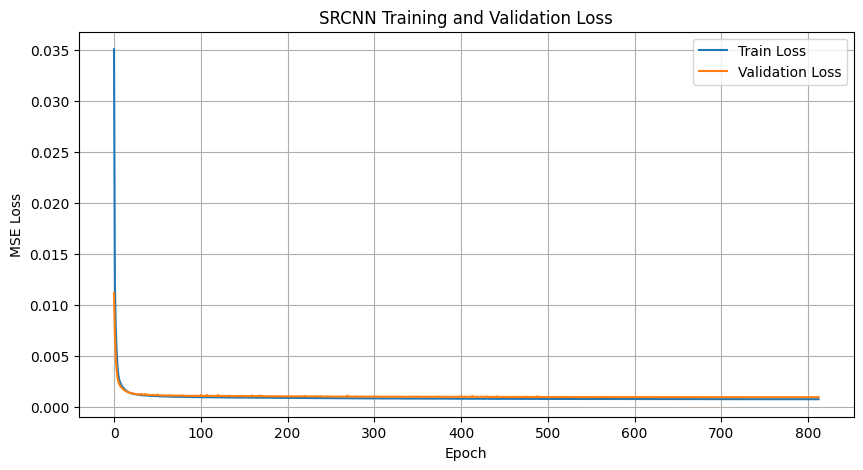

In [5]:
plt.figure(figsize=(10, 5))
plt.plot(train_loss, label='Train Loss')
plt.plot(val_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('MSE Loss')
plt.title('SRCNN Training and Validation Loss')
plt.legend()
plt.grid()
plt.show()

In [6]:
model = MODEL_CLASS(upsample_factor=factor)
weights, _ = load_results(model_name, factor)
model.load_state_dict(weights)
model.to(device)

FSRCNN(
  (extraction): Sequential(
    (0): Conv2d(1, 56, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): PReLU(num_parameters=56)
  )
  (shrinking): Sequential(
    (0): Conv2d(56, 12, kernel_size=(1, 1), stride=(1, 1))
    (1): PReLU(num_parameters=12)
  )
  (mapping): Sequential(
    (0): Conv2d(12, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): PReLU(num_parameters=12)
    (2): Conv2d(12, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): PReLU(num_parameters=12)
    (4): Conv2d(12, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): PReLU(num_parameters=12)
    (6): Conv2d(12, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): PReLU(num_parameters=12)
  )
  (expansion): Sequential(
    (0): Conv2d(12, 56, kernel_size=(1, 1), stride=(1, 1))
    (1): PReLU(num_parameters=56)
  )
  (upsample): Sequential(
    (0): ConvTranspose2d(56, 1, kernel_size=(9, 9), stride=(2, 2), padding=(4, 4), output_padding=(1, 1))
  )
)

In [12]:
evaluate_model_on_sets(model, sets=[5, 14], factor_list=[2], device=device, show_plots=False)

Set 5, Factor 2 - Average PSNR: 34.51 dB, SSIM: 0.9254
Set 14, Factor 2 - Average PSNR: 30.60 dB, SSIM: 0.8662


### Fine Tuning

In [3]:
ft_model = MODEL_CLASS(upsample_factor=factor)
weights, _ = load_results(model_name, factor)
ft_model.load_state_dict(weights)

train_loader, val_loader = get_dataloaders(factor, n_workers_train=0, n_workers_val=0, dataset="General100")

In [9]:
ft_train_loss, ft_val_loss, ft_psnr_list = train_model(ft_model, train_loader, val_loader, factor, num_epochs=ft_epochs, lr=ft_lr, criterion=criterion)
save_results(ft_model, ft_train_loss, ft_val_loss, ft_psnr_list, model_name, factor, ft=True)

Epoch 1/1000 - Training: 100%|██████████| 86/86 [00:49<00:00,  1.72it/s]


[Epoch 1] Train Loss: 0.000992
[Epoch 1] Validation Loss: 0.000985, PSNR: 33.83


Epoch 2/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 2] Train Loss: 0.000690
[Epoch 2] Validation Loss: 0.000983, PSNR: 33.84


Epoch 3/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 3] Train Loss: 0.000689
[Epoch 3] Validation Loss: 0.000983, PSNR: 33.84


Epoch 4/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 4] Train Loss: 0.000688
[Epoch 4] Validation Loss: 0.000982, PSNR: 33.84


Epoch 5/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 5] Train Loss: 0.000688
[Epoch 5] Validation Loss: 0.000982, PSNR: 33.84


Epoch 6/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 6] Train Loss: 0.000687
[Epoch 6] Validation Loss: 0.000982, PSNR: 33.85


Epoch 7/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 7] Train Loss: 0.000687
[Epoch 7] Validation Loss: 0.000981, PSNR: 33.85


Epoch 8/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 8] Train Loss: 0.000687
[Epoch 8] Validation Loss: 0.000981, PSNR: 33.85


Epoch 9/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 9] Train Loss: 0.000687
[Epoch 9] Validation Loss: 0.000981, PSNR: 33.85


Epoch 10/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 10] Train Loss: 0.000686
[Epoch 10] Validation Loss: 0.000981, PSNR: 33.85


Epoch 11/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 11] Train Loss: 0.000686
[Epoch 11] Validation Loss: 0.000981, PSNR: 33.85


Epoch 12/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 12] Train Loss: 0.000686
[Epoch 12] Validation Loss: 0.000981, PSNR: 33.85


Epoch 13/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 13] Train Loss: 0.000686
[Epoch 13] Validation Loss: 0.000980, PSNR: 33.85


Epoch 14/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.19it/s]


[Epoch 14] Train Loss: 0.000686
[Epoch 14] Validation Loss: 0.000980, PSNR: 33.85


Epoch 15/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 15] Train Loss: 0.000686
[Epoch 15] Validation Loss: 0.000980, PSNR: 33.85
No improvement for 1 epochs.


Epoch 16/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 16] Train Loss: 0.000686
[Epoch 16] Validation Loss: 0.000981, PSNR: 33.84
No improvement for 2 epochs.


Epoch 17/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 17] Train Loss: 0.000687
[Epoch 17] Validation Loss: 0.000981, PSNR: 33.84
No improvement for 3 epochs.


Epoch 18/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 18] Train Loss: 0.000695
[Epoch 18] Validation Loss: 0.000982, PSNR: 33.81
No improvement for 4 epochs.


Epoch 19/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 19] Train Loss: 0.000691
[Epoch 19] Validation Loss: 0.000980, PSNR: 33.85


Epoch 20/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.23it/s]


[Epoch 20] Train Loss: 0.000686
[Epoch 20] Validation Loss: 0.000980, PSNR: 33.86


Epoch 21/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 21] Train Loss: 0.000698
[Epoch 21] Validation Loss: 0.000981, PSNR: 33.81
No improvement for 1 epochs.


Epoch 22/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 22] Train Loss: 0.000687
[Epoch 22] Validation Loss: 0.000980, PSNR: 33.85
No improvement for 2 epochs.


Epoch 23/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 23] Train Loss: 0.000690
[Epoch 23] Validation Loss: 0.000982, PSNR: 33.77
No improvement for 3 epochs.


Epoch 24/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.23it/s]


[Epoch 24] Train Loss: 0.000690
[Epoch 24] Validation Loss: 0.000981, PSNR: 33.80
No improvement for 4 epochs.


Epoch 25/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 25] Train Loss: 0.000692
[Epoch 25] Validation Loss: 0.000980, PSNR: 33.86


Epoch 26/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 26] Train Loss: 0.000697
[Epoch 26] Validation Loss: 0.001033, PSNR: 32.86
No improvement for 1 epochs.


Epoch 27/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 27] Train Loss: 0.000687
[Epoch 27] Validation Loss: 0.000980, PSNR: 33.86


Epoch 28/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 28] Train Loss: 0.000693
[Epoch 28] Validation Loss: 0.000980, PSNR: 33.84
No improvement for 1 epochs.


Epoch 29/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 29] Train Loss: 0.000686
[Epoch 29] Validation Loss: 0.000989, PSNR: 33.60
No improvement for 2 epochs.


Epoch 30/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 30] Train Loss: 0.000693
[Epoch 30] Validation Loss: 0.001027, PSNR: 32.94
No improvement for 3 epochs.


Epoch 31/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 31] Train Loss: 0.000691
[Epoch 31] Validation Loss: 0.000981, PSNR: 33.80
No improvement for 4 epochs.


Epoch 32/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 32] Train Loss: 0.000688
[Epoch 32] Validation Loss: 0.000979, PSNR: 33.86


Epoch 33/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 33] Train Loss: 0.000691
[Epoch 33] Validation Loss: 0.000979, PSNR: 33.87


Epoch 34/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 34] Train Loss: 0.000696
[Epoch 34] Validation Loss: 0.000985, PSNR: 33.70
No improvement for 1 epochs.


Epoch 35/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 35] Train Loss: 0.000686
[Epoch 35] Validation Loss: 0.000980, PSNR: 33.82
No improvement for 2 epochs.


Epoch 36/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 36] Train Loss: 0.000684
[Epoch 36] Validation Loss: 0.000979, PSNR: 33.87


Epoch 37/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 37] Train Loss: 0.000702
[Epoch 37] Validation Loss: 0.000979, PSNR: 33.84
No improvement for 1 epochs.


Epoch 38/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 38] Train Loss: 0.000685
[Epoch 38] Validation Loss: 0.000979, PSNR: 33.86
No improvement for 2 epochs.


Epoch 39/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 39] Train Loss: 0.000688
[Epoch 39] Validation Loss: 0.000979, PSNR: 33.87


Epoch 40/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 40] Train Loss: 0.000696
[Epoch 40] Validation Loss: 0.000979, PSNR: 33.87
No improvement for 1 epochs.


Epoch 41/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 41] Train Loss: 0.000686
[Epoch 41] Validation Loss: 0.000979, PSNR: 33.84
No improvement for 2 epochs.


Epoch 42/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 42] Train Loss: 0.000695
[Epoch 42] Validation Loss: 0.000979, PSNR: 33.85
No improvement for 3 epochs.


Epoch 43/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 43] Train Loss: 0.000683
[Epoch 43] Validation Loss: 0.000979, PSNR: 33.83
No improvement for 4 epochs.


Epoch 44/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 44] Train Loss: 0.000692
[Epoch 44] Validation Loss: 0.000982, PSNR: 33.75
No improvement for 5 epochs.


Epoch 45/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 45] Train Loss: 0.000686
[Epoch 45] Validation Loss: 0.000980, PSNR: 33.82
No improvement for 6 epochs.


Epoch 46/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 46] Train Loss: 0.000683
[Epoch 46] Validation Loss: 0.000978, PSNR: 33.87


Epoch 47/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 47] Train Loss: 0.000682
[Epoch 47] Validation Loss: 0.000978, PSNR: 33.88


Epoch 48/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 48] Train Loss: 0.000682
[Epoch 48] Validation Loss: 0.000978, PSNR: 33.87
No improvement for 1 epochs.


Epoch 49/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 49] Train Loss: 0.000682
[Epoch 49] Validation Loss: 0.000977, PSNR: 33.88


Epoch 50/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 50] Train Loss: 0.000682
[Epoch 50] Validation Loss: 0.000978, PSNR: 33.87
No improvement for 1 epochs.


Epoch 51/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 51] Train Loss: 0.000682
[Epoch 51] Validation Loss: 0.000978, PSNR: 33.88
No improvement for 2 epochs.


Epoch 52/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 52] Train Loss: 0.000682
[Epoch 52] Validation Loss: 0.000977, PSNR: 33.88


Epoch 53/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 53] Train Loss: 0.000682
[Epoch 53] Validation Loss: 0.000977, PSNR: 33.88
No improvement for 1 epochs.


Epoch 54/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.24it/s]


[Epoch 54] Train Loss: 0.000682
[Epoch 54] Validation Loss: 0.000978, PSNR: 33.87
No improvement for 2 epochs.


Epoch 55/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 55] Train Loss: 0.000682
[Epoch 55] Validation Loss: 0.000977, PSNR: 33.88
No improvement for 3 epochs.


Epoch 56/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 56] Train Loss: 0.000682
[Epoch 56] Validation Loss: 0.000977, PSNR: 33.88


Epoch 57/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 57] Train Loss: 0.000682
[Epoch 57] Validation Loss: 0.000977, PSNR: 33.88
No improvement for 1 epochs.


Epoch 58/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 58] Train Loss: 0.000682
[Epoch 58] Validation Loss: 0.000977, PSNR: 33.88
No improvement for 2 epochs.


Epoch 59/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 59] Train Loss: 0.000682
[Epoch 59] Validation Loss: 0.000977, PSNR: 33.88
No improvement for 3 epochs.


Epoch 60/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 60] Train Loss: 0.000682
[Epoch 60] Validation Loss: 0.000977, PSNR: 33.88


Epoch 61/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 61] Train Loss: 0.000682
[Epoch 61] Validation Loss: 0.000977, PSNR: 33.88
No improvement for 1 epochs.


Epoch 62/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 62] Train Loss: 0.000682
[Epoch 62] Validation Loss: 0.000977, PSNR: 33.88


Epoch 63/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 63] Train Loss: 0.000682
[Epoch 63] Validation Loss: 0.000977, PSNR: 33.88
No improvement for 1 epochs.


Epoch 64/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 64] Train Loss: 0.000681
[Epoch 64] Validation Loss: 0.000977, PSNR: 33.88
No improvement for 2 epochs.


Epoch 65/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 65] Train Loss: 0.000681
[Epoch 65] Validation Loss: 0.000977, PSNR: 33.88
No improvement for 3 epochs.


Epoch 66/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 66] Train Loss: 0.000681
[Epoch 66] Validation Loss: 0.000977, PSNR: 33.88


Epoch 67/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 67] Train Loss: 0.000681
[Epoch 67] Validation Loss: 0.000977, PSNR: 33.88
No improvement for 1 epochs.


Epoch 68/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 68] Train Loss: 0.000681
[Epoch 68] Validation Loss: 0.000977, PSNR: 33.88
No improvement for 2 epochs.


Epoch 69/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 69] Train Loss: 0.000681
[Epoch 69] Validation Loss: 0.000977, PSNR: 33.88


Epoch 70/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 70] Train Loss: 0.000681
[Epoch 70] Validation Loss: 0.000977, PSNR: 33.88


Epoch 71/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 71] Train Loss: 0.000681
[Epoch 71] Validation Loss: 0.000977, PSNR: 33.88


Epoch 72/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 72] Train Loss: 0.000681
[Epoch 72] Validation Loss: 0.000977, PSNR: 33.88


Epoch 73/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 73] Train Loss: 0.000681
[Epoch 73] Validation Loss: 0.000977, PSNR: 33.88


Epoch 74/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 74] Train Loss: 0.000681
[Epoch 74] Validation Loss: 0.000977, PSNR: 33.88
No improvement for 1 epochs.


Epoch 75/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 75] Train Loss: 0.000681
[Epoch 75] Validation Loss: 0.000977, PSNR: 33.88


Epoch 76/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 76] Train Loss: 0.000681
[Epoch 76] Validation Loss: 0.000977, PSNR: 33.87
No improvement for 1 epochs.


Epoch 77/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 77] Train Loss: 0.000681
[Epoch 77] Validation Loss: 0.000976, PSNR: 33.88


Epoch 78/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 78] Train Loss: 0.000681
[Epoch 78] Validation Loss: 0.000976, PSNR: 33.88


Epoch 79/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 79] Train Loss: 0.000681
[Epoch 79] Validation Loss: 0.000978, PSNR: 33.82
No improvement for 1 epochs.


Epoch 80/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 80] Train Loss: 0.000681
[Epoch 80] Validation Loss: 0.000976, PSNR: 33.88
No improvement for 2 epochs.


Epoch 81/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 81] Train Loss: 0.000681
[Epoch 81] Validation Loss: 0.000976, PSNR: 33.89


Epoch 82/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 82] Train Loss: 0.000681
[Epoch 82] Validation Loss: 0.000976, PSNR: 33.88
No improvement for 1 epochs.


Epoch 83/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 83] Train Loss: 0.000681
[Epoch 83] Validation Loss: 0.000976, PSNR: 33.89


Epoch 84/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 84] Train Loss: 0.000680
[Epoch 84] Validation Loss: 0.000976, PSNR: 33.89
No improvement for 1 epochs.


Epoch 85/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 85] Train Loss: 0.000680
[Epoch 85] Validation Loss: 0.000976, PSNR: 33.88
No improvement for 2 epochs.


Epoch 86/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 86] Train Loss: 0.000681
[Epoch 86] Validation Loss: 0.000976, PSNR: 33.89


Epoch 87/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 87] Train Loss: 0.000681
[Epoch 87] Validation Loss: 0.000978, PSNR: 33.82
No improvement for 1 epochs.


Epoch 88/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 88] Train Loss: 0.000681
[Epoch 88] Validation Loss: 0.000976, PSNR: 33.89


Epoch 89/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 89] Train Loss: 0.000680
[Epoch 89] Validation Loss: 0.000976, PSNR: 33.88
No improvement for 1 epochs.


Epoch 90/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.23it/s]


[Epoch 90] Train Loss: 0.000680
[Epoch 90] Validation Loss: 0.000978, PSNR: 33.82
No improvement for 2 epochs.


Epoch 91/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 91] Train Loss: 0.000681
[Epoch 91] Validation Loss: 0.000977, PSNR: 33.84
No improvement for 3 epochs.


Epoch 92/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 92] Train Loss: 0.000680
[Epoch 92] Validation Loss: 0.000976, PSNR: 33.89


Epoch 93/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 93] Train Loss: 0.000680
[Epoch 93] Validation Loss: 0.000975, PSNR: 33.89


Epoch 94/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 94] Train Loss: 0.000680
[Epoch 94] Validation Loss: 0.000975, PSNR: 33.89


Epoch 95/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 95] Train Loss: 0.000680
[Epoch 95] Validation Loss: 0.000975, PSNR: 33.89
No improvement for 1 epochs.


Epoch 96/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 96] Train Loss: 0.000680
[Epoch 96] Validation Loss: 0.000975, PSNR: 33.89
No improvement for 2 epochs.


Epoch 97/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 97] Train Loss: 0.000680
[Epoch 97] Validation Loss: 0.000975, PSNR: 33.89


Epoch 98/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 98] Train Loss: 0.000680
[Epoch 98] Validation Loss: 0.000975, PSNR: 33.89


Epoch 99/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 99] Train Loss: 0.000680
[Epoch 99] Validation Loss: 0.000975, PSNR: 33.89


Epoch 100/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 100] Train Loss: 0.000680
[Epoch 100] Validation Loss: 0.000975, PSNR: 33.90


Epoch 101/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 101] Train Loss: 0.000680
[Epoch 101] Validation Loss: 0.000975, PSNR: 33.90
No improvement for 1 epochs.


Epoch 102/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 102] Train Loss: 0.000679
[Epoch 102] Validation Loss: 0.000975, PSNR: 33.90
No improvement for 2 epochs.


Epoch 103/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 103] Train Loss: 0.000679
[Epoch 103] Validation Loss: 0.000975, PSNR: 33.90
No improvement for 3 epochs.


Epoch 104/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 104] Train Loss: 0.000679
[Epoch 104] Validation Loss: 0.000975, PSNR: 33.90
No improvement for 4 epochs.


Epoch 105/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 105] Train Loss: 0.000679
[Epoch 105] Validation Loss: 0.000975, PSNR: 33.90


Epoch 106/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.11it/s]


[Epoch 106] Train Loss: 0.000679
[Epoch 106] Validation Loss: 0.000975, PSNR: 33.90


Epoch 107/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 107] Train Loss: 0.000679
[Epoch 107] Validation Loss: 0.000975, PSNR: 33.90


Epoch 108/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 108] Train Loss: 0.000679
[Epoch 108] Validation Loss: 0.000975, PSNR: 33.90
No improvement for 1 epochs.


Epoch 109/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 109] Train Loss: 0.000679
[Epoch 109] Validation Loss: 0.000975, PSNR: 33.90
No improvement for 2 epochs.


Epoch 110/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 110] Train Loss: 0.000679
[Epoch 110] Validation Loss: 0.000975, PSNR: 33.90
No improvement for 3 epochs.


Epoch 111/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 111] Train Loss: 0.000679
[Epoch 111] Validation Loss: 0.000975, PSNR: 33.90


Epoch 112/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 112] Train Loss: 0.000679
[Epoch 112] Validation Loss: 0.000975, PSNR: 33.90
No improvement for 1 epochs.


Epoch 113/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 113] Train Loss: 0.000679
[Epoch 113] Validation Loss: 0.000975, PSNR: 33.90
No improvement for 2 epochs.


Epoch 114/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 114] Train Loss: 0.000679
[Epoch 114] Validation Loss: 0.000975, PSNR: 33.90


Epoch 115/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 115] Train Loss: 0.000679
[Epoch 115] Validation Loss: 0.000975, PSNR: 33.90


Epoch 116/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 116] Train Loss: 0.000679
[Epoch 116] Validation Loss: 0.000975, PSNR: 33.89
No improvement for 1 epochs.


Epoch 117/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.23it/s]


[Epoch 117] Train Loss: 0.000679
[Epoch 117] Validation Loss: 0.000975, PSNR: 33.90
No improvement for 2 epochs.


Epoch 118/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 118] Train Loss: 0.000679
[Epoch 118] Validation Loss: 0.000974, PSNR: 33.90


Epoch 119/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 119] Train Loss: 0.000679
[Epoch 119] Validation Loss: 0.000975, PSNR: 33.90
No improvement for 1 epochs.


Epoch 120/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 120] Train Loss: 0.000679
[Epoch 120] Validation Loss: 0.000974, PSNR: 33.90
No improvement for 2 epochs.


Epoch 121/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 121] Train Loss: 0.000679
[Epoch 121] Validation Loss: 0.000974, PSNR: 33.90


Epoch 122/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 122] Train Loss: 0.000679
[Epoch 122] Validation Loss: 0.000975, PSNR: 33.88
No improvement for 1 epochs.


Epoch 123/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 123] Train Loss: 0.000679
[Epoch 123] Validation Loss: 0.000974, PSNR: 33.90


Epoch 124/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 124] Train Loss: 0.000679
[Epoch 124] Validation Loss: 0.000974, PSNR: 33.90


Epoch 125/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 125] Train Loss: 0.000679
[Epoch 125] Validation Loss: 0.000974, PSNR: 33.90
No improvement for 1 epochs.


Epoch 126/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 126] Train Loss: 0.000678
[Epoch 126] Validation Loss: 0.000974, PSNR: 33.90
No improvement for 2 epochs.


Epoch 127/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 127] Train Loss: 0.000679
[Epoch 127] Validation Loss: 0.000974, PSNR: 33.90
No improvement for 3 epochs.


Epoch 128/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 128] Train Loss: 0.000679
[Epoch 128] Validation Loss: 0.000974, PSNR: 33.90


Epoch 129/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 129] Train Loss: 0.000679
[Epoch 129] Validation Loss: 0.000974, PSNR: 33.90
No improvement for 1 epochs.


Epoch 130/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 130] Train Loss: 0.000678
[Epoch 130] Validation Loss: 0.000974, PSNR: 33.90
No improvement for 2 epochs.


Epoch 131/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 131] Train Loss: 0.000678
[Epoch 131] Validation Loss: 0.000974, PSNR: 33.91


Epoch 132/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 132] Train Loss: 0.000678
[Epoch 132] Validation Loss: 0.000974, PSNR: 33.91


Epoch 133/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 133] Train Loss: 0.000678
[Epoch 133] Validation Loss: 0.000974, PSNR: 33.91
No improvement for 1 epochs.


Epoch 134/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 134] Train Loss: 0.000678
[Epoch 134] Validation Loss: 0.000974, PSNR: 33.91


Epoch 135/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 135] Train Loss: 0.000678
[Epoch 135] Validation Loss: 0.000974, PSNR: 33.91


Epoch 136/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.23it/s]


[Epoch 136] Train Loss: 0.000678
[Epoch 136] Validation Loss: 0.000974, PSNR: 33.91


Epoch 137/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 137] Train Loss: 0.000678
[Epoch 137] Validation Loss: 0.000974, PSNR: 33.91
No improvement for 1 epochs.


Epoch 138/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 138] Train Loss: 0.000678
[Epoch 138] Validation Loss: 0.000974, PSNR: 33.90
No improvement for 2 epochs.


Epoch 139/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 139] Train Loss: 0.000678
[Epoch 139] Validation Loss: 0.000974, PSNR: 33.91


Epoch 140/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 140] Train Loss: 0.000678
[Epoch 140] Validation Loss: 0.000974, PSNR: 33.90
No improvement for 1 epochs.


Epoch 141/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 141] Train Loss: 0.000678
[Epoch 141] Validation Loss: 0.000974, PSNR: 33.91


Epoch 142/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 142] Train Loss: 0.000678
[Epoch 142] Validation Loss: 0.000974, PSNR: 33.91


Epoch 143/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 143] Train Loss: 0.000678
[Epoch 143] Validation Loss: 0.000974, PSNR: 33.91


Epoch 144/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 144] Train Loss: 0.000678
[Epoch 144] Validation Loss: 0.000974, PSNR: 33.91
No improvement for 1 epochs.


Epoch 145/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 145] Train Loss: 0.000678
[Epoch 145] Validation Loss: 0.000974, PSNR: 33.91
No improvement for 2 epochs.


Epoch 146/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.15it/s]


[Epoch 146] Train Loss: 0.000678
[Epoch 146] Validation Loss: 0.000974, PSNR: 33.91
No improvement for 3 epochs.


Epoch 147/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 147] Train Loss: 0.000678
[Epoch 147] Validation Loss: 0.000974, PSNR: 33.90
No improvement for 4 epochs.


Epoch 148/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 148] Train Loss: 0.000678
[Epoch 148] Validation Loss: 0.000973, PSNR: 33.91


Epoch 149/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 149] Train Loss: 0.000678
[Epoch 149] Validation Loss: 0.000973, PSNR: 33.91


Epoch 150/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 150] Train Loss: 0.000678
[Epoch 150] Validation Loss: 0.000974, PSNR: 33.91
No improvement for 1 epochs.


Epoch 151/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 151] Train Loss: 0.000678
[Epoch 151] Validation Loss: 0.000973, PSNR: 33.91


Epoch 152/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 152] Train Loss: 0.000678
[Epoch 152] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 1 epochs.


Epoch 153/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 153] Train Loss: 0.000678
[Epoch 153] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 2 epochs.


Epoch 154/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 154] Train Loss: 0.000678
[Epoch 154] Validation Loss: 0.000973, PSNR: 33.91


Epoch 155/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 155] Train Loss: 0.000678
[Epoch 155] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 1 epochs.


Epoch 156/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 156] Train Loss: 0.000678
[Epoch 156] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 2 epochs.


Epoch 157/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 157] Train Loss: 0.000677
[Epoch 157] Validation Loss: 0.000973, PSNR: 33.91


Epoch 158/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 158] Train Loss: 0.000677
[Epoch 158] Validation Loss: 0.000973, PSNR: 33.91


Epoch 159/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 159] Train Loss: 0.000677
[Epoch 159] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 1 epochs.


Epoch 160/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 160] Train Loss: 0.000677
[Epoch 160] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 2 epochs.


Epoch 161/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 161] Train Loss: 0.000677
[Epoch 161] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 3 epochs.


Epoch 162/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 162] Train Loss: 0.000677
[Epoch 162] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 4 epochs.


Epoch 163/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 163] Train Loss: 0.000677
[Epoch 163] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 5 epochs.


Epoch 164/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 164] Train Loss: 0.000677
[Epoch 164] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 6 epochs.


Epoch 165/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.19it/s]


[Epoch 165] Train Loss: 0.000677
[Epoch 165] Validation Loss: 0.000973, PSNR: 33.91


Epoch 166/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 166] Train Loss: 0.000677
[Epoch 166] Validation Loss: 0.000973, PSNR: 33.91


Epoch 167/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 167] Train Loss: 0.000677
[Epoch 167] Validation Loss: 0.000973, PSNR: 33.91


Epoch 168/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 168] Train Loss: 0.000677
[Epoch 168] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 1 epochs.


Epoch 169/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 169] Train Loss: 0.000677
[Epoch 169] Validation Loss: 0.000973, PSNR: 33.91


Epoch 170/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 170] Train Loss: 0.000677
[Epoch 170] Validation Loss: 0.000973, PSNR: 33.91


Epoch 171/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 171] Train Loss: 0.000677
[Epoch 171] Validation Loss: 0.000973, PSNR: 33.91


Epoch 172/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 172] Train Loss: 0.000677
[Epoch 172] Validation Loss: 0.000973, PSNR: 33.91


Epoch 173/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 173] Train Loss: 0.000677
[Epoch 173] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 1 epochs.


Epoch 174/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 174] Train Loss: 0.000677
[Epoch 174] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 2 epochs.


Epoch 175/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 175] Train Loss: 0.000677
[Epoch 175] Validation Loss: 0.000973, PSNR: 33.91


Epoch 176/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 176] Train Loss: 0.000677
[Epoch 176] Validation Loss: 0.000973, PSNR: 33.91


Epoch 177/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 177] Train Loss: 0.000677
[Epoch 177] Validation Loss: 0.000973, PSNR: 33.91


Epoch 178/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 178] Train Loss: 0.000677
[Epoch 178] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 1 epochs.


Epoch 179/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 179] Train Loss: 0.000677
[Epoch 179] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 2 epochs.


Epoch 180/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 180] Train Loss: 0.000677
[Epoch 180] Validation Loss: 0.000973, PSNR: 33.91


Epoch 181/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 181] Train Loss: 0.000677
[Epoch 181] Validation Loss: 0.000973, PSNR: 33.91


Epoch 182/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 182] Train Loss: 0.000677
[Epoch 182] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 1 epochs.


Epoch 183/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 183] Train Loss: 0.000677
[Epoch 183] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 2 epochs.


Epoch 184/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 184] Train Loss: 0.000677
[Epoch 184] Validation Loss: 0.000973, PSNR: 33.91


Epoch 185/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.19it/s]


[Epoch 185] Train Loss: 0.000677
[Epoch 185] Validation Loss: 0.000973, PSNR: 33.91


Epoch 186/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 186] Train Loss: 0.000677
[Epoch 186] Validation Loss: 0.000973, PSNR: 33.91


Epoch 187/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 187] Train Loss: 0.000677
[Epoch 187] Validation Loss: 0.000973, PSNR: 33.91


Epoch 188/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 188] Train Loss: 0.000677
[Epoch 188] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 1 epochs.


Epoch 189/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 189] Train Loss: 0.000677
[Epoch 189] Validation Loss: 0.000973, PSNR: 33.91


Epoch 190/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.23it/s]


[Epoch 190] Train Loss: 0.000677
[Epoch 190] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 1 epochs.


Epoch 191/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.16it/s]


[Epoch 191] Train Loss: 0.000677
[Epoch 191] Validation Loss: 0.000973, PSNR: 33.91


Epoch 192/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 192] Train Loss: 0.000677
[Epoch 192] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 1 epochs.


Epoch 193/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 193] Train Loss: 0.000677
[Epoch 193] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 2 epochs.


Epoch 194/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 194] Train Loss: 0.000677
[Epoch 194] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 3 epochs.


Epoch 195/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 195] Train Loss: 0.000677
[Epoch 195] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 4 epochs.


Epoch 196/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.20it/s]


[Epoch 196] Train Loss: 0.000677
[Epoch 196] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 5 epochs.


Epoch 197/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.18it/s]


[Epoch 197] Train Loss: 0.000677
[Epoch 197] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 6 epochs.


Epoch 198/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 198] Train Loss: 0.000677
[Epoch 198] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 7 epochs.


Epoch 199/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.21it/s]


[Epoch 199] Train Loss: 0.000677
[Epoch 199] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 8 epochs.


Epoch 200/1000 - Training: 100%|██████████| 86/86 [00:27<00:00,  3.17it/s]


[Epoch 200] Train Loss: 0.000677
[Epoch 200] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 9 epochs.


Epoch 201/1000 - Training: 100%|██████████| 86/86 [00:26<00:00,  3.22it/s]


[Epoch 201] Train Loss: 0.000677
[Epoch 201] Validation Loss: 0.000973, PSNR: 33.91
No improvement for 10 epochs.
Early stopping triggered at epoch 201


In [4]:
ft_model = MODEL_CLASS(upsample_factor=factor)
ft_weights, _ = load_results(model_name, factor, ft=True)
ft_model.load_state_dict(ft_weights)
ft_model.to(device)

FSRCNN(
  (extraction): Sequential(
    (0): Conv2d(1, 56, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): PReLU(num_parameters=56)
  )
  (shrinking): Sequential(
    (0): Conv2d(56, 12, kernel_size=(1, 1), stride=(1, 1))
    (1): PReLU(num_parameters=12)
  )
  (mapping): Sequential(
    (0): Conv2d(12, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): PReLU(num_parameters=12)
    (2): Conv2d(12, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): PReLU(num_parameters=12)
    (4): Conv2d(12, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): PReLU(num_parameters=12)
    (6): Conv2d(12, 12, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): PReLU(num_parameters=12)
  )
  (expansion): Sequential(
    (0): Conv2d(12, 56, kernel_size=(1, 1), stride=(1, 1))
    (1): PReLU(num_parameters=56)
  )
  (upsample): Sequential(
    (0): ConvTranspose2d(56, 1, kernel_size=(9, 9), stride=(2, 2), padding=(4, 4), output_padding=(1, 1))
  )
)

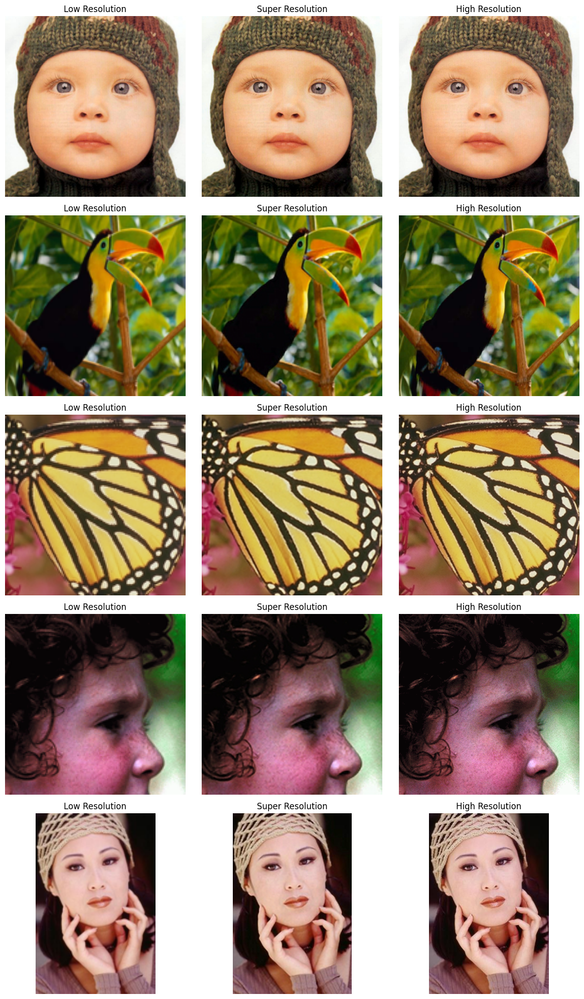

Set 5, Factor 2 - Average PSNR: 34.54 dB, SSIM: 0.9257


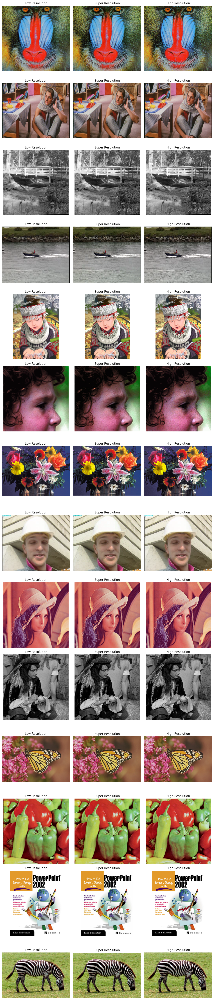

Set 14, Factor 2 - Average PSNR: 30.62 dB, SSIM: 0.8666


In [5]:
evaluate_model_on_sets(ft_model, sets=[5, 14], factor_list=[2], device=device, show_plots=True)